In [1]:
import sys
print(sys.path)
from arnie.mfe import mfe
import seaborn as sns
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt 
nan = np.nan

['/Users/jgc/Desktop/SSRP_research', '', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages', '/Users/jgc/Desktop/SSRP_research/packages', '/Users/jgc/Desktop/SSRP_research', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python37.zip', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/lib-dynload', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/IPython/extensions', '/Users/jgc/.ipython']


In [2]:
#import function for datasets
def new_import(file_name):
    shape_fname = file_name 
    f = open(shape_fname)
    shape_lines= f.readlines()
    f.close()
    return shape_lines

In [3]:
#importing file with genome nucleotide (Note this code has 'T')

f = open('refseq.txt')
lines = f.readlines()
f.close()
whole_genome = lines[0].strip('\n')


In [4]:
# Step 1 on dataset: Only numbers and nan on datasets (stipping '\n')
def shape_lines_unnorm(shape_lines):
    all_shape_lines_no_nan = []
    for number in shape_lines:
        if number == '-999\n':
            all_shape_lines_no_nan.append('nan')
        elif number =='nan\n':
             all_shape_lines_no_nan.append('nan')
        elif number =='nan': #line added for 'nan' in dms shape
             all_shape_lines_no_nan.append('nan')
        else:
            all_shape_lines_no_nan.append(number)   
    float_lines=[float(i) for i in all_shape_lines_no_nan]
    return (float_lines)

In [5]:
#Step 2 on datset: Using function Ramya provided for normailization
def normalize_shape(shape_reacs):
    shape_reacs = np.array(shape_reacs)

    # Get rid of nan values for now
    nonan_shape_reacs = shape_reacs[~np.isnan(shape_reacs)]

    # Find Filter 1: 1.5 * Inter-Quartile Range
    sorted_shape = np.sort(nonan_shape_reacs)
    q1 = sorted_shape[int(0.25 * len(sorted_shape))]
    q3 = sorted_shape[int(0.75 * len(sorted_shape))]
    iq_range = abs(q3 - q1)
    filter1 = next(x for x, val in \
        enumerate(list(sorted_shape)) if val > 1.5 * iq_range)

    # Find Filter 2: 95% value
    filter2 = int(0.95 * len(sorted_shape))

    # Get maximum filter value and fiter data
    filter_cutoff = sorted_shape[max(filter1, filter2)]
    sorted_shape = sorted_shape[sorted_shape < filter_cutoff]

    # Scalefactor: Mean of top 10th percentile of values
    top90 = sorted_shape[int(0.9 * len(sorted_shape))]
    scalefactor = np.mean(sorted_shape[sorted_shape > top90])
        
    # Scale dataset
    return shape_reacs/scalefactor

In [6]:
#Step 3 on dataset: range from 0-2
def shape_norm_for_heatmap(shape_norm):
    all_shape_lines_no_nan = []
    for number in shape_norm:
        if number < 0:
            all_shape_lines_no_nan.append(0)
        elif number > 2:
            all_shape_lines_no_nan.append(2)
        #elif number > '10': #if number is over 10 for some reason program was ignoring it (eg. das)
            #all_shape_lines_no_nan.append(2)
        else:
            all_shape_lines_no_nan.append(number)   
    float_lines=[float(i) for i in all_shape_lines_no_nan]
    return (float_lines)

In [7]:
#Function for datasets (goes through step 1-3)
def function_for_heatmap_data(shape_lines):
    shape_lines_unnormalize = shape_lines_unnorm(shape_lines) 
    shape_lines_norm = normalize_shape(shape_lines_unnormalize)
    shape_norm_for_heatmap_var = shape_norm_for_heatmap(shape_lines_norm)
    return shape_norm_for_heatmap_var

In [8]:
#Changing "T" to "U" in sequence 
def sequence_no_T(sequence):
    reactivity_no_GU= []
    for idx in range(0, len(sequence)):
        if sequence[idx] =='T':
            reactivity_no_GU.append('U')
        else:
            reactivity_no_GU.append(sequence[idx])
    return reactivity_no_GU

In [9]:
# Base-pair similarity 
def bp_func(dot_bracket):
    struct_sim= []
    for idx in range(0, len(dot_bracket)):
        if dot_bracket[idx] == ".":
            struct_sim.append(1) #1 means base is unpaired
        else:
            struct_sim.append(0) #0 means base is paired
    return(struct_sim)

In [10]:
#Conversation values to floats
def covert_conservation_to_floats(conservation_lines):
    conservation_numbers = []
    for number in conservation_lines:
        if number == '\ufeff1\n':
            conservation_numbers.append(1)
        else:
            conservation_numbers.append(number)   
    float_lines=[float(i) for i in conservation_numbers]
    return (float_lines)

## SHAPE DATASETS 5'UTR

In [11]:
shape_lines_5utr_das_trs = new_import('5utr_das_trs.csv')
shape_norm_5utr_das= function_for_heatmap_data(shape_lines_5utr_das_trs)

In [12]:
shape_lines_5utr_incarnato = new_import('5utr_incarnato.csv')
shape_norm_5utr_incarnato = function_for_heatmap_data(shape_lines_5utr_incarnato)


In [13]:
shape_lines_5utr_pyle = new_import('5utr_pyle.csv')
shape_norm_5utr_pyle = function_for_heatmap_data(shape_lines_5utr_pyle)


In [14]:
shape_lines_5utr_weeks = new_import('5utr_weeks.csv')
shape_norm_5utr_weeks = function_for_heatmap_data(shape_lines_5utr_weeks)


In [15]:
#Rouskin DMS data: replace G & T shape valueswith 'nan'
shape_lines_5utr_rouskin = new_import('5utr_rouskin.csv')
sequence_5utr = whole_genome[0:450]

In [16]:
#for dms data : replacing 'G' & 'T' with 'nan'
def dms_data(sequence,shape_lines):
    reactivity_no_GU= []
    for idx in range(0, len(sequence)):
        if sequence[idx] =='G':
            reactivity_no_GU.append('nan\n')
        elif sequence[idx]=='T':
            reactivity_no_GU.append('nan\n')
        else:
            reactivity_no_GU.append(shape_lines[idx])
    return reactivity_no_GU

In [17]:
rouskin_dms_lines = dms_data(sequence_5utr,shape_lines_5utr_rouskin)
shape_norm_5utr_rouskin = function_for_heatmap_data(rouskin_dms_lines)


In [18]:
shape_lines_5utr_zhang_invivo= new_import('5utr_zhang_invivo.csv') 
shape_norm_for_heatmap_5utr_zhang_invivo=function_for_heatmap_data(shape_lines_5utr_zhang_invivo)


In [19]:
shape_lines_5utr_zhang_invitro= new_import('5utr_zhang_invitro.csv') 
shape_norm_for_heatmap_5utr_zhang_invitro=function_for_heatmap_data(shape_lines_5utr_zhang_invitro)


In [20]:
# adding Das lab data SL2-6
shape_lines_5utr_das_sl26 = new_import('5utr_das_sl26.csv') 
shape_norm_for_heatmap_5utr_das_sl26=function_for_heatmap_data(shape_lines_5utr_das_sl26)


In [21]:
#Sl26 csv file: needed to create "space holders" so values on csv file values are set exactly on the SL2-6
#Made 100 nucleotide list with nan values to then manipulate into space; fitting sl2-6 into right nucleotide places
def sl26_func(list_of_100):
    das_SL_list=[]
    for number in list_of_100:
        das_SL_list.append(nan)
    return(das_SL_list)

In [22]:
list_of_100 =list(range(1,101))
list_of_100_nan=sl26_func(list_of_100)

In [23]:
new_sl26_list= list_of_100_nan[0:44] + shape_norm_for_heatmap_5utr_das_sl26 + list_of_100_nan + list_of_100_nan[0:6]

In [24]:
#x-axis
sequence_5utr_no_T = sequence_no_T(sequence_5utr)
position_5utr=list(range(1,451))
xaxis_5utr = [''.join([sequence_5utr_no_T[i], str(position_5utr[i])]) for i in range(0, len(sequence_5utr_no_T))]


In [25]:
dot_bracket_5utr = "......(((((.(((((....)))))..)))))...(((((((.(((((.....))))).((((.......))))........((((((((.((.((((.(((.....))).)))))).))))))))....((((.....)))).(((((((((((((((..(((((...(((.(((((((.(((..((((((.(((((......)))))..))))))......)))(((((((.((......)))))))))(((....))).)))))))))).))))).))))...)))))))..................))))..((((((...)))))).(((((.((((....(((((.(((((((((((((.....))).)))))..))))).)))))...(((((...))))))))))))))........))))))).....(((.....)))"

In [26]:
bp_heatmap_5utr = bp_func(dot_bracket_5utr)

In [27]:
LNA3=list(range(190,215)) #190-214
LNA6=list(range(44,88)) #44-87
LNA7=list(range(292,323)) #292-322
LNA8=list(range(235,256)) #235-255
LNA14=list(range(258,277)) #258-276

In [28]:
def suplot_lna(position_5utr):
    new_number=[]
    for number in position_5utr:
    #for number in range(0, len(position_5utr)):
        #new_number=[]
        if number==number in LNA3:
            new_number.append(1)
        elif number == number in LNA6:
            new_number.append(1)
        elif number == number in LNA7:
            new_number.append(1)
        elif number == number in LNA8:
            new_number.append(1)
        elif number == number in LNA14:
            new_number.append(1)
        else:
            new_number.append(0)
    return new_number

In [29]:
subplot_5utr_lna = suplot_lna(position_5utr)


In [30]:
sars_conservation_lines = new_import('sarsr_conservation.csv') 


In [31]:
conservation_floats = covert_conservation_to_floats(sars_conservation_lines)
conservation_5utr = conservation_floats[0:450]


In [32]:
#punp track 5UTR
punp_lines_contrafold= new_import('contrafold.csv') 
punp_lines_eternafold= new_import('eternafold.csv') 
punp_lines_vienna_2 = new_import('vienna_2.csv') 


In [33]:
def punp_float(lines):
    float_lines_list = []
    for number in lines:  
        float_lines_list.append(number)
    
    float_lines=[float(i) for i in float_lines_list]
    return float_lines

In [34]:
punp_track_contrafold = punp_float(punp_lines_contrafold)
punp_track_eternafold = punp_float(punp_lines_eternafold)
punp_track_vienna_2 = punp_float(punp_lines_vienna_2)

In [35]:
punp_track_contrafold_5utr = punp_track_contrafold[0:450]
punp_track_eternafold_5utr = punp_track_eternafold[0:450]
punp_track_vienna_2_5utr = punp_track_vienna_2[0:450]


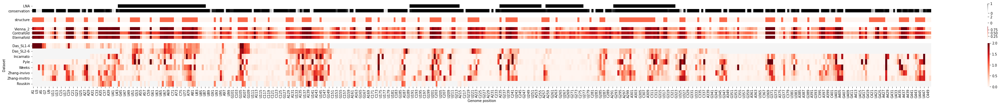

In [36]:
#5'utr range: 1-450 [0:450] 
data1 =shape_norm_5utr_das
data2 =new_sl26_list
data3 =shape_norm_5utr_incarnato
data4 =shape_norm_5utr_pyle
data5 =shape_norm_5utr_weeks
data6 =shape_norm_for_heatmap_5utr_zhang_invivo
data7 =shape_norm_for_heatmap_5utr_zhang_invitro
data8 =shape_norm_5utr_rouskin

data = np.array([data1, data2, data3, data4, data5, data6, data7, data8]) # First make a numpy array with your data

# Move the data from a numpy array to a DataFrame with row and column labels
data_df = pd.DataFrame(data=data, \
			index=["Das_SL1-4", "Das_SL2-6", "Incarnato", "Pyle", "Weeks", "Zhang-invivo", "Zhang-invitro","Rouskin"], \
			columns=xaxis_5utr)
mask = data_df.isnull() # Create a mask for all the "nan" values

# Now on to making the plot!
color_map = plt.cm.get_cmap('Reds') # Set up color scheme
color_map.set_bad("whitesmoke") # nan values will now be gray

fig,ax = plt.subplots(4, 1, gridspec_kw={'height_ratios': [1.1, .7, 1.5, 5]},figsize=(60, 5))

#LNA and conservation track
lna_conservation_data = np.array([subplot_5utr_lna, conservation_5utr]) 
lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
			index=["LNA","conservation"], \
			columns=xaxis_5utr)
fig.subplots_adjust(wspace=0.01)
sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
for i in range(lna_conservation_data_df.shape[0] + 1):
	ax[0].axhline(i, color='white', lw=4)
    

#Structure track
structures_data = np.array([bp_heatmap_5utr]) 
structures_data_df = pd.DataFrame(data=structures_data, \
			index=["structure"], \
			columns=xaxis_5utr)

fig.subplots_adjust(wspace=0.01)
struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
for i in range(structures_data_df.shape[0] + 1):
	ax[1].axhline(i, color='white', lw=4)
struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)

#New track:p(unp) track
punp_data = np.array([punp_track_vienna_2_5utr, punp_track_contrafold_5utr, punp_track_eternafold_5utr]) 
punp_data_df = pd.DataFrame(data=punp_data, \
			index=["Vienna_2", "Contrafold", "Eternafold"], \
			columns=xaxis_5utr)
fig.subplots_adjust(wspace=0.01)
sns.heatmap(punp_data_df, cmap='Reds', ax=ax[2], xticklabels=False)
for i in range(punp_data_df.shape[0] + 1):
	ax[2].axhline(i, color='white', lw=4)

heat_map= sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[3])
heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
plt.xlabel("Genome position") # X axis label
plt.ylabel("Dataset") # Y axis label
plt.gcf().subplots_adjust(bottom=0.19)

#plt.savefig('heatmap_5utr_punp.pdf')

plt.show()

## FSE

In [37]:
sequence_fse = whole_genome[13458:13546]


In [38]:
shape_lines_fse_incarnato = new_import('fse_incarnato.csv') 
shape_norm_for_heatmap_fse_incarnato=function_for_heatmap_data(shape_lines_fse_incarnato)


In [39]:
shape_lines_fse_pyle = new_import('fse_pyle.csv') 
shape_norm_for_heatmap_fse_pyle=function_for_heatmap_data(shape_lines_fse_pyle)


In [40]:
shape_lines_fse_vanya = new_import('fse_vanya.csv') 
shape_norm_for_heatmap_fse_vanya=function_for_heatmap_data(shape_lines_fse_vanya)


In [41]:
shape_lines_fse_ann_vanya = new_import('fse_ann_vanya_plusfse.csv') 
shape_norm_for_heatmap_fse_ann_vanya=function_for_heatmap_data(shape_lines_fse_ann_vanya)


In [42]:
shape_lines_fse_weeks = new_import('fse_weeks.csv') 
shape_norm_for_heatmap_fse_weeks=function_for_heatmap_data(shape_lines_fse_weeks)


In [43]:
shape_lines_fse_rouskin= new_import('fse_rouskin.csv') #DMS data
rouskin_dms_lines_fse = dms_data(sequence_fse,shape_lines_fse_rouskin)
shape_norm_for_heatmap_fse_rouskin=function_for_heatmap_data(rouskin_dms_lines_fse)


In [44]:
shape_lines_fse_zhang_invivo= new_import('fse_zhang_invivo.csv') 
shape_norm_for_heatmap_fse_zhang_invivo=function_for_heatmap_data(shape_lines_fse_zhang_invivo)


In [45]:
shape_lines_fse_zhang_invitro= new_import('fse_zhang_invitro.csv') 
shape_norm_for_heatmap_fse_zhang_invitro=function_for_heatmap_data(shape_lines_fse_zhang_invitro)


In [46]:
#add m2seq data
shape_lines_fse_das_m2seq= new_import('fse_vanya_m2seq.csv') 
shape_norm_for_heatmap_fse_das_m2seq=function_for_heatmap_data(shape_lines_fse_das_m2seq)


In [47]:
#Conservation track
conservation_fse = conservation_floats[13458:13546]


In [48]:
#structure track
structure_fse ="................((((((((((....[[[[..))))))))))(((((((((.........))).)))))).....]]]]....."
strucure_track_fse = bp_func(structure_fse)

In [49]:
#xaxis
sequence_fse_no_T = sequence_no_T(sequence_fse)
position_fse=list(range(13459,13547))
fse_xaxis= [''.join([sequence_fse_no_T[i], str(position_fse[i])]) for i in range(0, len(sequence_fse))]


In [50]:
#punp for FSE range
punp_track_contrafold_fse = punp_track_contrafold[13458:13546]
punp_track_eternafold_fse = punp_track_eternafold[13458:13546]
punp_track_vienna_2_fse = punp_track_vienna_2[13458:13546]


<function matplotlib.pyplot.show(*args, **kw)>

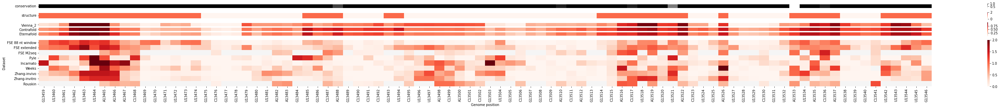

In [51]:
#FSE range: 13459-13546 [13458:13546]
data1 = shape_norm_for_heatmap_fse_vanya # change name to FSE 85 nt window
data2 = shape_norm_for_heatmap_fse_ann_vanya
data3 = shape_norm_for_heatmap_fse_das_m2seq
data4 = shape_norm_for_heatmap_fse_pyle
data5 = shape_norm_for_heatmap_fse_incarnato
data6 = shape_norm_for_heatmap_fse_weeks
data7 = shape_norm_for_heatmap_fse_zhang_invivo
data8 = shape_norm_for_heatmap_fse_zhang_invitro
data9 = shape_norm_for_heatmap_fse_rouskin
data = np.array([data1, data2, data3, data4, data5, data6, data7, data8, data9]) # First make a numpy array with your data

# Move the data from a numpy array to a DataFrame with row and column labels
data_df = pd.DataFrame(data=data, \
			index=["FSE 88 nt window", "FSE extended", "FSE M2seq", "Pyle", 'Incarnato', 'Weeks', "Zhang-invivo", "Zhang-invitro","Rouskin" ], \
			columns= fse_xaxis)
mask = data_df.isnull() # Create a mask for all the "nan" values

# Now on to making the plot!
color_map = plt.cm.get_cmap('Reds') # Set up color scheme
color_map.set_bad("whitesmoke") # nan values will now be gray

fig,ax = plt.subplots(4, 1, gridspec_kw={'height_ratios': [.55, .7, 1.5, 5]},figsize=(60, 5))

#LNA and conservation track
lna_conservation_data = np.array([conservation_fse]) 
lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
			index=["conservation"], \
			columns=fse_xaxis)
fig.subplots_adjust(wspace=0.01)
lna_conserv_heatmap= sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
for i in range(lna_conservation_data_df.shape[0] + 1):
	ax[0].axhline(i, color='white', lw=4)
lna_conserv_heatmap.set_yticklabels(lna_conserv_heatmap.get_yticklabels(),va='center', rotation=0)
   

#Structure track
structures_data = np.array([strucure_track_fse]) 
structures_data_df = pd.DataFrame(data=structures_data, \
			index=["structure"], \
			columns=fse_xaxis)

fig.subplots_adjust(wspace=0.01)
struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
for i in range(structures_data_df.shape[0] + 1):
	ax[1].axhline(i, color='white', lw=4)
struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)

#New track:p(unp) track
punp_data = np.array([punp_track_vienna_2_fse, punp_track_contrafold_fse, punp_track_eternafold_fse]) 
punp_data_df = pd.DataFrame(data=punp_data, \
			index=["Vienna_2", "Contrafold", "Eternafold"], \
			columns=fse_xaxis)
fig.subplots_adjust(wspace=0.01)
sns.heatmap(punp_data_df, cmap='Reds', ax=ax[2], xticklabels=False)
for i in range(punp_data_df.shape[0] + 1):
	ax[2].axhline(i, color='white', lw=4)

sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[3])
heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
plt.xlabel("Genome position") # X axis label
plt.ylabel("Dataset") # Y axis label
plt.gcf().subplots_adjust(bottom=0.19)

#plt.savefig('heatmap_fse_punp.pdf')
plt.show

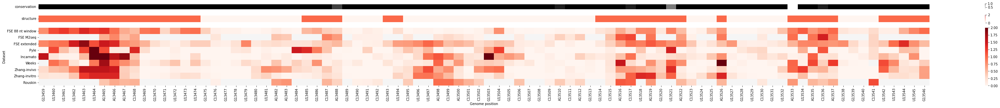

In [52]:
#New fse for powerpoint presentation (only conservation and structure track)
data1 = shape_norm_for_heatmap_fse_vanya # change name to FSE 85 nt window
data2 = shape_norm_for_heatmap_fse_das_m2seq
data3 = shape_norm_for_heatmap_fse_ann_vanya
data4 = shape_norm_for_heatmap_fse_pyle
data5 = shape_norm_for_heatmap_fse_incarnato
data6 = shape_norm_for_heatmap_fse_weeks
data7 = shape_norm_for_heatmap_fse_zhang_invivo
data8 = shape_norm_for_heatmap_fse_zhang_invitro
data9 = shape_norm_for_heatmap_fse_rouskin
data = np.array([data1, data2, data3, data4, data5, data6, data7, data8, data9]) # First make a numpy array with your data

# Move the data from a numpy array to a DataFrame with row and column labels
data_df = pd.DataFrame(data=data, \
			index=["FSE 88 nt window","FSE M2seq","FSE extended", "Pyle", 'Incarnato', 'Weeks', "Zhang-invivo", "Zhang-invitro","Rouskin" ], \
			columns= fse_xaxis)
mask = data_df.isnull() # Create a mask for all the "nan" values

# Now on to making the plot!
color_map = plt.cm.get_cmap('Reds') # Set up color scheme
color_map.set_bad("whitesmoke") # nan values will now be gray

fig,ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [.55, .7, 5]},figsize=(60, 5))

#LNA and conservation track
lna_conservation_data = np.array([conservation_fse]) 
lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
			index=["conservation"], \
			columns=fse_xaxis)
fig.subplots_adjust(wspace=0.01)
lna_conserv_heatmap= sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
for i in range(lna_conservation_data_df.shape[0] + 1):
	ax[0].axhline(i, color='white', lw=4)
lna_conserv_heatmap.set_yticklabels(lna_conserv_heatmap.get_yticklabels(),va='center', rotation=0)
   

#Structure track
structures_data = np.array([strucure_track_fse]) 
structures_data_df = pd.DataFrame(data=structures_data, \
			index=["structure"], \
			columns=fse_xaxis)

fig.subplots_adjust(wspace=0.01)
struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
for i in range(structures_data_df.shape[0] + 1):
	ax[1].axhline(i, color='white', lw=4)
struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)



sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[2])
heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
plt.xlabel("Genome position") # X axis label
plt.ylabel("Dataset") # Y axis label
plt.gcf().subplots_adjust(bottom=0.19)

plt.savefig('heatmap_fse_NEW_SYMPOSIUM.pdf')
#plt.show

## Heatmaps MID regions

## MID4

In [53]:
#mid4 genome wide data
shape_lines_incarnato = new_import('incarnato_normalized_reactivity.csv')
shape_lines_pyle = new_import('pyle_normalized_reactivity.csv')
shape_lines_zhang_invivo = new_import('zhang_invivo_normalized_reactivity.csv')
shape_lines_zhang_invitro = new_import('zhang_invitro_normalized_reactivity.csv') 

In [54]:
#mid4_region 10424:10555
shape_lines_mid4_incarnato = shape_lines_incarnato[10423:10555]
shape_norm_for_heatmap_mid4_incarnato=function_for_heatmap_data(shape_lines_mid4_incarnato)

shape_lines_mid4_pyle = shape_lines_pyle[10423:10555]
shape_norm_for_heatmap_mid4_pyle=function_for_heatmap_data(shape_lines_mid4_pyle)


shape_lines_mid4_zhang_invivo = shape_lines_zhang_invivo[10423:10555]
shape_norm_for_heatmap_mid4_zhang_invivo=function_for_heatmap_data(shape_lines_mid4_zhang_invivo)

shape_lines_mid4_zhang_invitro = shape_lines_zhang_invitro[10423:10555]
shape_norm_for_heatmap_mid4_zhang_invitro=function_for_heatmap_data(shape_lines_mid4_zhang_invitro)




In [55]:
#Das lab windowed data
shape_lines_mid4_das = new_import('mid4_vanya.csv') 
shape_norm_for_heatmap_mid4_das=function_for_heatmap_data(shape_lines_mid4_das)


In [56]:
#LNA
##mid4: 10424-10555 add lna track ex :LNA3=list(range(190,215)) #190-214
lna_18= list(range(10483,10504))
position_mid4=list(range(10424,10556))


In [57]:
def suplot_lna_mid4(position):
    new_number=[]
    for number in position:
        if number==number in lna_18:
            new_number.append(1)
        else:
            new_number.append(0)
    return new_number

In [58]:
mid4_lna = suplot_lna_mid4(position_mid4)


In [59]:
#Conservation
conservation_mid4 = conservation_floats[10423:10555]


In [60]:
#Structure track
mid4_windowed = '((((...................(((.(.....(((((((((((.....))))))))))).....)))).(((((......)))))...............................))))...........'
structure_track_mid4 = bp_func(mid4_windowed)


In [61]:
#x_axis for mid4
sequence_mid4 = whole_genome[10423:10555]
sequence_mid4_no_T = sequence_no_T(sequence_mid4)
xaxis_mid4 = [''.join([sequence_mid4_no_T[i], str(position_mid4[i])]) for i in range(0, len(sequence_mid4_no_T))]

In [62]:
#punp for mid4 range
punp_track_contrafold_mid4 = punp_track_contrafold[10423:10555]
punp_track_eternafold_mid4 = punp_track_eternafold[10423:10555]
punp_track_vienna_2_mid4 = punp_track_vienna_2[10423:10555]

In [63]:
def function_for_mid_heatmaps():
    data = np.array([data1, data2, data3, data4, data5]) # First make a numpy array with your data

    # Move the data from a numpy array to a DataFrame with row and column labels
    data_df = pd.DataFrame(data=data, \
                index=["Das", "Pyle", "Incarnato", "Zhang-invivo", "Zhang-invitro"], \
                columns=xaxis)
    mask = data_df.isnull() # Create a mask for all the "nan" values

    # Now on to making the plot!
    color_map = plt.cm.get_cmap('Reds') # Set up color scheme
    color_map.set_bad("whitesmoke") # nan values will now be gray

    fig,ax = plt.subplots(4, 1, gridspec_kw={'height_ratios': [1.1, .7, 1.5, 5]},figsize=(60, 5))

    #LNA and conservation track
    lna_conservation_data = np.array([lna, conservation]) 
    lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
                index=["lna", "conservation"], \
                columns=xaxis)
    fig.subplots_adjust(wspace=0.01)
    lna_conserv_heatmap= sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
    for i in range(lna_conservation_data_df.shape[0] + 1):
        ax[0].axhline(i, color='white', lw=4)
    lna_conserv_heatmap.set_yticklabels(lna_conserv_heatmap.get_yticklabels(),va='center', rotation=0)


    #Structure track
    structures_data = np.array([structure]) 
    structures_data_df = pd.DataFrame(data=structures_data, \
                index=["structure"], \
                columns=xaxis)

    fig.subplots_adjust(wspace=0.01)
    struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
    for i in range(structures_data_df.shape[0] + 1):
        ax[1].axhline(i, color='white', lw=4)
    struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)

    #New track:p(unp) track
    punp_data = np.array([vienna_2, contrafold, eternafold]) 
    punp_data_df = pd.DataFrame(data=punp_data, \
                index=["Vienna_2", "Contrafold", "Eternafold"], \
                columns=xaxis)
    fig.subplots_adjust(wspace=0.01)
    sns.heatmap(punp_data_df, cmap='Reds', ax=ax[2], xticklabels=False)
    for i in range(punp_data_df.shape[0] + 1):
        ax[2].axhline(i, color='white', lw=4)

    sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[3])
    heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
    plt.xlabel("Genome position") # X axis label
    plt.ylabel("Dataset") # Y axis label
    plt.gcf().subplots_adjust(bottom=0.19)


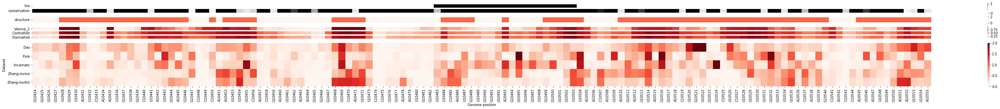

In [64]:
#mid4 range: 10424-10555 [10423:10555]

data1 = shape_norm_for_heatmap_mid4_das
data2 = shape_norm_for_heatmap_mid4_pyle
data3 = shape_norm_for_heatmap_mid4_incarnato
data4 = shape_norm_for_heatmap_mid4_zhang_invivo
data5 = shape_norm_for_heatmap_mid4_zhang_invitro
xaxis = xaxis_mid4
lna = mid4_lna
conservation = conservation_mid4
structure = structure_track_mid4
vienna_2 = punp_track_vienna_2_mid4
contrafold = punp_track_contrafold_mid4
eternafold = punp_track_eternafold_mid4

function_for_mid_heatmaps()
#plt.savefig('heatmap_mid4_punp.pdf')


## MID 7

In [65]:
#mid7_region:28712-28851
shape_lines_mid7_incarnato = shape_lines_incarnato[28711:28851]
shape_norm_for_heatmap_mid7_incarnato=function_for_heatmap_data(shape_lines_mid7_incarnato)

shape_lines_mid7_pyle = shape_lines_pyle[28711:28851]
shape_norm_for_heatmap_mid7_pyle=function_for_heatmap_data(shape_lines_mid7_pyle)

shape_lines_mid7_zhang_invivo = shape_lines_zhang_invivo[28711:28851]
shape_norm_for_heatmap_mid7_zhang_invivo=function_for_heatmap_data(shape_lines_mid7_zhang_invivo)

shape_lines_mid7_zhang_invitro = shape_lines_zhang_invitro[28711:28851]
shape_norm_for_heatmap_mid7_zhang_invitro=function_for_heatmap_data(shape_lines_mid7_zhang_invitro)


In [66]:
#Windowed data
shape_lines_mid7_das = new_import('mid7_vanya.csv') 
shape_norm_for_heatmap_mid7_das=function_for_heatmap_data(shape_lines_mid7_das)


In [67]:
#xaxis for mid 7 #mid7_region:28712-28851
#mid8_region: 28979-29118
sequence_mid7 = whole_genome[28711:28851]
print(sequence_mid7)

position_mid7=list(range(28712,28852))
print(position_mid7)

sequence_mid7_no_T = sequence_no_T(sequence_mid7)
xaxis_mid7 = [''.join([sequence_mid7_no_T[i], str(position_mid7[i])]) for i in range(0, len(sequence_mid7_no_T))]
print(xaxis_mid7)

GGCACCCGCAATCCTGCTAACAATGCTGCAATCGTGCTACAACTTCCTCAAGGAACAACATTGCCAAAAGGCTTCTACGCAGAAGGGAGCAGAGGCGGCAGTCAAGCCTCTTCTCGTTCCTCATCACGTAGTCGCAACAG
[28712, 28713, 28714, 28715, 28716, 28717, 28718, 28719, 28720, 28721, 28722, 28723, 28724, 28725, 28726, 28727, 28728, 28729, 28730, 28731, 28732, 28733, 28734, 28735, 28736, 28737, 28738, 28739, 28740, 28741, 28742, 28743, 28744, 28745, 28746, 28747, 28748, 28749, 28750, 28751, 28752, 28753, 28754, 28755, 28756, 28757, 28758, 28759, 28760, 28761, 28762, 28763, 28764, 28765, 28766, 28767, 28768, 28769, 28770, 28771, 28772, 28773, 28774, 28775, 28776, 28777, 28778, 28779, 28780, 28781, 28782, 28783, 28784, 28785, 28786, 28787, 28788, 28789, 28790, 28791, 28792, 28793, 28794, 28795, 28796, 28797, 28798, 28799, 28800, 28801, 28802, 28803, 28804, 28805, 28806, 28807, 28808, 28809, 28810, 28811, 28812, 28813, 28814, 28815, 28816, 28817, 28818, 28819, 28820, 28821, 28822, 28823, 28824, 28825, 28826, 28827, 28828, 28829, 28830, 28831, 28832, 28833, 2883

In [68]:
#LNA
#mid7_region:28712-28851 add lna track ex :LNA3=list(range(190,215)) #190-214
lna_12= list(range(28743,28793))

In [69]:
def suplot_lna_new(position,lna):
    new_number=[]
    for number in position:
        if number==number in lna:
            new_number.append(1)
        else:
            new_number.append(0)
    return new_number

In [70]:
mid7_lna = suplot_lna_new(position_mid7,lna_12)


In [71]:
#Conservation
conservation_mid7 = conservation_floats[28711:28851]

In [72]:
#Structure
mid7_windowed = ('((((........((.............((......))..............))........)))).....((..(((((..((.(((((((((((.(((......))).))))).))))))..)).)))))..)).....')
structure_track_mid7 = bp_func(mid7_windowed)

In [73]:
##punp for mid7 range
punp_track_contrafold_mid7 = punp_track_contrafold[28711:28851]
punp_track_eternafold_mid7 = punp_track_eternafold[28711:28851]
punp_track_vienna_2_mid7 = punp_track_vienna_2[28711:28851]


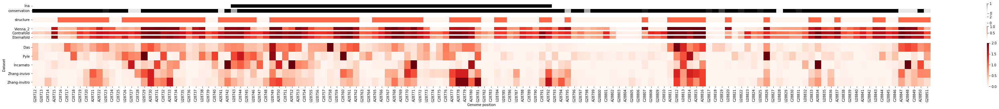

In [74]:
data1 = shape_norm_for_heatmap_mid7_das
data2 =shape_norm_for_heatmap_mid7_pyle
data3 =shape_norm_for_heatmap_mid7_incarnato
data4 = shape_norm_for_heatmap_mid7_zhang_invivo
data5 =shape_norm_for_heatmap_mid7_zhang_invitro
xaxis = xaxis_mid7
lna = mid7_lna
conservation = conservation_mid7
structure = structure_track_mid7
vienna_2 = punp_track_vienna_2_mid7
contrafold = punp_track_contrafold_mid7
eternafold = punp_track_eternafold_mid7

function_for_mid_heatmaps()

## MID 8

In [75]:
##mid8_region: 28979-29118
shape_lines_mid8_incarnato = shape_lines_incarnato[28978:29118]
shape_norm_for_heatmap_mid8_incarnato=function_for_heatmap_data(shape_lines_mid8_incarnato)

shape_lines_mid8_pyle = shape_lines_pyle[28978:29118]
shape_norm_for_heatmap_mid8_pyle=function_for_heatmap_data(shape_lines_mid8_pyle)

shape_lines_mid8_zhang_invivo = shape_lines_zhang_invivo[28978:29118]
shape_norm_for_heatmap_mid8_zhang_invivo=function_for_heatmap_data(shape_lines_mid8_zhang_invivo)

shape_lines_mid8_zhang_invitro = shape_lines_zhang_invitro[28978:29118]
shape_norm_for_heatmap_mid8_zhang_invitro=function_for_heatmap_data(shape_lines_mid8_zhang_invitro)



In [76]:
#windowed data
shape_lines_mid8_das = new_import('mid8_vanya.csv') 
shape_norm_for_heatmap_mid8_das=function_for_heatmap_data(shape_lines_mid8_das)


In [77]:
#xaxis
sequence_mid8 = whole_genome[28978:29118]
print(sequence_mid8)

position_mid8=list(range(28979,29119))
print(position_mid8)

sequence_mid8_no_T = sequence_no_T(sequence_mid8)
xaxis_mid8 = [''.join([sequence_mid8_no_T[i], str(position_mid8[i])]) for i in range(0, len(sequence_mid8_no_T))]
print(xaxis_mid8)

GGTAAAGGCCAACAACAACAAGGCCAAACTGTCACTAAGAAATCTGCTGCTGAGGCTTCTAAGAAGCCTCGGCAAAAACGTACTGCCACTAAAGCATACAATGTAACACAAGCTTTCGGCAGACGTGGTCCAGAACAAAC
[28979, 28980, 28981, 28982, 28983, 28984, 28985, 28986, 28987, 28988, 28989, 28990, 28991, 28992, 28993, 28994, 28995, 28996, 28997, 28998, 28999, 29000, 29001, 29002, 29003, 29004, 29005, 29006, 29007, 29008, 29009, 29010, 29011, 29012, 29013, 29014, 29015, 29016, 29017, 29018, 29019, 29020, 29021, 29022, 29023, 29024, 29025, 29026, 29027, 29028, 29029, 29030, 29031, 29032, 29033, 29034, 29035, 29036, 29037, 29038, 29039, 29040, 29041, 29042, 29043, 29044, 29045, 29046, 29047, 29048, 29049, 29050, 29051, 29052, 29053, 29054, 29055, 29056, 29057, 29058, 29059, 29060, 29061, 29062, 29063, 29064, 29065, 29066, 29067, 29068, 29069, 29070, 29071, 29072, 29073, 29074, 29075, 29076, 29077, 29078, 29079, 29080, 29081, 29082, 29083, 29084, 29085, 29086, 29087, 29088, 29089, 29090, 29091, 29092, 29093, 29094, 29095, 29096, 29097, 29098, 29099, 29100, 2910

In [78]:
#LNA
#mid8_region: 28979-29118 add lna track ex :LNA3=list(range(190,215)) #190-214
lna_2= list(range(29008,29033))
mid8_lna = suplot_lna_new(position_mid8,lna_2)

In [79]:
#Conservation
conservation_mid8 = conservation_floats[28978:29118]

In [80]:
#Structure
mid8_windowed = ('......((((...........)))).................((((.((((((((((((...))))))))))))...((((.(((((...(((((................))))).)))))))))....))))......')
structure_track_mid8 = bp_func(mid8_windowed)

In [81]:
#punp for mid8 range
punp_track_contrafold_mid8 = punp_track_contrafold[28978:29118]
print(punp_track_contrafold_mid8)
punp_track_eternafold_mid8 = punp_track_eternafold[28978:29118]
print(punp_track_eternafold_mid8)
punp_track_vienna_2_mid8 = punp_track_vienna_2[28978:29118]
print(punp_track_vienna_2_mid8)

[0.465976, 0.479629, 0.565653, 0.950176, 0.958773, 0.901236, 0.431285, 0.247018, 0.23172, 0.31579, 0.831803, 0.930653, 0.888576, 0.936725, 0.971171, 0.941492, 0.969114, 0.984139, 0.948803, 0.965157, 0.952557, 0.477485, 0.467268, 0.488419, 0.540145, 0.957116, 0.967357, 0.912417, 0.760227, 0.771176, 0.780561, 0.834282, 0.79942, 0.864051, 0.936227, 0.939708, 0.974322, 0.85393, 0.777537, 0.895113, 0.930265, 0.967777, 0.856433, 0.823591, 0.777571, 0.802382, 0.834316, 0.512409, 0.331125, 0.314309, 0.338744, 0.297265, 0.253401, 0.175527, 0.175749, 0.233862, 0.264675, 0.353142, 0.492552, 0.866285, 0.986465, 0.918298, 0.545437, 0.42297, 0.3485, 0.273598, 0.255169, 0.285671, 0.29365, 0.309941, 0.286271, 0.255571, 0.294278, 0.588942, 0.978086, 0.978485, 0.970635, 0.713817, 0.557711, 0.428342, 0.516723, 0.920166, 0.453101, 0.28989, 0.231993, 0.23803, 0.478823, 0.979377, 0.920572, 0.987493, 0.688827, 0.548376, 0.49265, 0.286472, 0.339874, 0.857226, 0.8502, 0.897863, 0.897155, 0.994214, 0.984284, 0.

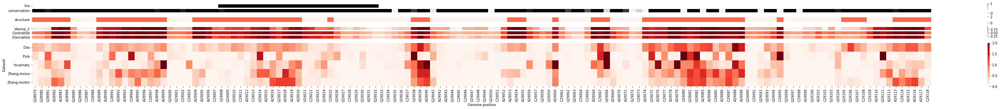

In [82]:
data1 = shape_norm_for_heatmap_mid8_das
data2 =shape_norm_for_heatmap_mid8_pyle
data3 =shape_norm_for_heatmap_mid8_incarnato
data4 = shape_norm_for_heatmap_mid8_zhang_invivo
data5 =shape_norm_for_heatmap_mid8_zhang_invitro
xaxis = xaxis_mid8
lna = mid8_lna
conservation = conservation_mid8
structure = structure_track_mid8
vienna_2 = punp_track_vienna_2_mid8
contrafold = punp_track_contrafold_mid8
eternafold = punp_track_eternafold_mid8

function_for_mid_heatmaps()

## New MID REGIONS

In [83]:
#function that can only be used for 1 lna in a region
def suplot_only_one_lna(position,lna):
    new_number=[]
    for number in position:
        if number==number in lna:
            new_number.append(1)
        else:
            new_number.append(0)
    return new_number

## MID 3b

In [84]:
#mid3b_region: 13713-13852 [13712:13852]
shape_lines_mid3b_incarnato = shape_lines_incarnato[13712:13852]
shape_norm_for_heatmap_mid3b_incarnato=function_for_heatmap_data(shape_lines_mid3b_incarnato)

shape_lines_mid3b_pyle = shape_lines_pyle[13712:13852]
shape_norm_for_heatmap_mid3b_pyle=function_for_heatmap_data(shape_lines_mid3b_pyle)

shape_lines_mid3b_zhang_invivo = shape_lines_zhang_invivo[13712:13852]
shape_norm_for_heatmap_mid3b_zhang_invivo=function_for_heatmap_data(shape_lines_mid3b_zhang_invivo)

shape_lines_mid3b_zhang_invitro = shape_lines_zhang_invitro[13712:13852]
shape_norm_for_heatmap_mid3b_zhang_invitro=function_for_heatmap_data(shape_lines_mid3b_zhang_invitro)

In [85]:
#windowed data
shape_lines_mid3b_das = new_import('mid3b_vanya.csv')
shape_norm_for_heatmap_mid3b_das=function_for_heatmap_data(shape_lines_mid3b_das)

In [86]:
#xaxis
mid3b_sequence = whole_genome[13712:13852]
position_mid3b =list(range(13713,13853))

sequence_mid3b_no_T = sequence_no_T(mid3b_sequence)
xaxis_mid3b = [''.join([sequence_mid3b_no_T[i], str(position_mid3b[i])]) for i in range(0, len(sequence_mid3b_no_T))]

In [87]:
#LNA
#mid3b: 13713-13852
#LNA1: 13761-13788
LNA1 =list(range(13761,13789))

mid3b_lna = suplot_only_one_lna(position_mid3b,LNA1)

In [88]:
#Conservation
conservation_mid3b = conservation_floats[13712:13852]

In [89]:
#structure mid3b
dot_bracket_mid3b = '.............................................(((((.((((.(((((.......))))).)))).))))).....................(((((((.((((......))))...)))).)))..'
structure_track_mid3b = bp_func(dot_bracket_mid3b)

In [90]:
#punp for mid3b: 13713-13852 [13712:13852]

punp_track_vienna_2_mid3b = punp_track_vienna_2[13712:13852]
print(punp_track_vienna_2_mid3b)
punp_track_contrafold_mid3b = punp_track_contrafold[13712:13852]
print(punp_track_contrafold_mid3b)
punp_track_eternafold_mid3b = punp_track_eternafold[13712:13852]
print(punp_track_eternafold_mid3b)

[0.080393, 0.032873, 0.043619, 0.635583, 0.566768, 0.036491, 0.057396, 0.375152, 0.928635, 0.667357, 0.399714, 0.411301, 0.277275, 0.246473, 0.245609, 0.260741, 0.42603, 0.447092, 0.452609, 0.674671, 0.292415, 0.185605, 0.186888, 0.545896, 0.604274, 0.186545, 0.221452, 0.455781, 0.964873, 0.364215, 0.357715, 0.353704, 0.129716, 0.103041, 0.104446, 0.352467, 0.007182, 0.043178, 0.610411, 0.611842, 0.311625, 0.505568, 0.865351, 0.585589, 0.578811, 0.124954, 0.064733, 0.147705, 0.075446, 0.055994, 0.969228, 0.262713, 0.000626, 0.001354, 0.01076, 0.993262, 0.010499, 0.001729, 0.011524, 0.014662, 0.093971, 0.999282, 0.999178, 0.999294, 0.994041, 0.994446, 0.991923, 0.997366, 0.093708, 0.016782, 0.007827, 0.003285, 0.011945, 0.994239, 0.008616, 0.004794, 0.004877, 0.280478, 0.985913, 0.034409, 0.06984, 0.164556, 0.144814, 0.256494, 0.798055, 0.971527, 0.929304, 0.904971, 0.927681, 0.936118, 0.960584, 0.945627, 0.992111, 0.416326, 0.409249, 0.089986, 0.078086, 0.098198, 0.182716, 0.634453, 0.

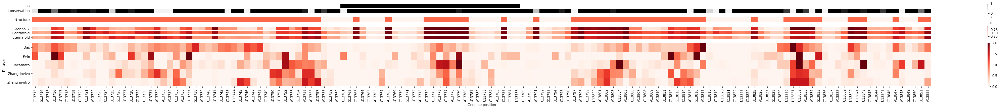

In [91]:
data1 = shape_norm_for_heatmap_mid3b_das
data2 =shape_norm_for_heatmap_mid3b_pyle
data3 =shape_norm_for_heatmap_mid3b_incarnato
data4 = shape_norm_for_heatmap_mid3b_zhang_invivo
data5 =shape_norm_for_heatmap_mid3b_zhang_invitro
xaxis = xaxis_mid3b
lna = mid3b_lna
conservation = conservation_mid3b
structure = structure_track_mid3b
vienna_2 = punp_track_vienna_2_mid3b
contrafold = punp_track_contrafold_mid3b
eternafold = punp_track_eternafold_mid3b

function_for_mid_heatmaps()

## MiD5

In [92]:
#mid5: 17479:17618 [17478:17618]
shape_lines_mid5_incarnato = shape_lines_incarnato[17478:17618]
shape_norm_for_heatmap_mid5_incarnato=function_for_heatmap_data(shape_lines_mid5_incarnato)

shape_lines_mid5_pyle = shape_lines_pyle[17478:17618]
shape_norm_for_heatmap_mid5_pyle=function_for_heatmap_data(shape_lines_mid5_pyle)

shape_lines_mid5_zhang_invivo = shape_lines_zhang_invivo[17478:17618]
shape_norm_for_heatmap_mid5_zhang_invivo=function_for_heatmap_data(shape_lines_mid5_zhang_invivo)

shape_lines_mid5_zhang_invitro = shape_lines_zhang_invitro[17478:17618]
shape_norm_for_heatmap_mid5_zhang_invitro =function_for_heatmap_data(shape_lines_mid5_zhang_invitro)

In [93]:
#windowed data
shape_lines_mid5_das = new_import('mid5_vanya.csv')
shape_norm_for_heatmap_mid5_das=function_for_heatmap_data(shape_lines_mid5_das)

In [94]:
#xaxis
mid5_sequence = whole_genome[17478:17618]
position_mid5=list(range(17479,17619))

sequence_mid5_no_T = sequence_no_T(mid5_sequence)
xaxis_mid5 = [''.join([sequence_mid5_no_T[i], str(position_mid5[i])]) for i in range(0, len(sequence_mid5_no_T))]

In [95]:
#LNA
#mid5: 17479-17618 
#LNA4: 17529-17547

LNA4 =list(range(17529,17548))
mid5_lna = suplot_lna_new(position_mid5,LNA4)

In [96]:
#Conservation
conservation_mid5 = conservation_floats[17478:17618]

In [97]:
#structure mid5
dot_bracket_mid5 = '(((((......(.(((.......(((((((((.....(((((((.......)))))))..((((.((((....)))).))))((......)).))))).))))......))))..)))))..(((((........)))))'
structure_track_mid5 = bp_func(dot_bracket_mid5)

In [98]:
#punp for mid5: 17479:17618 [17478:17618]

punp_track_vienna_2_mid5 = punp_track_vienna_2[17478:17618]
print(punp_track_vienna_2_mid5)
punp_track_contrafold_mid5 = punp_track_contrafold[17478:17618]
print(punp_track_contrafold_mid5)
punp_track_eternafold_mid5 = punp_track_eternafold[17478:17618]
print(punp_track_eternafold_mid5)

[0.348738, 0.340381, 0.074859, 0.06681, 0.016784, 0.020288, 0.022984, 0.040815, 0.992885, 0.120966, 0.13484, 0.288207, 0.986907, 0.968661, 0.945528, 0.13925, 0.193177, 0.536983, 0.928515, 0.997197, 0.974462, 0.529706, 0.247896, 0.281863, 0.969104, 0.904939, 0.186397, 0.037451, 0.034997, 0.049792, 0.011637, 0.0116, 0.020048, 0.029754, 0.071035, 0.523328, 0.989522, 0.333843, 0.333936, 0.325295, 0.328471, 0.33193, 0.334685, 0.316211, 0.355773, 0.969579, 0.999468, 0.998885, 0.990164, 0.954835, 0.260761, 0.159276, 0.144858, 0.133841, 0.142097, 0.038376, 0.096182, 0.039583, 0.828717, 0.907169, 0.092617, 0.037173, 0.011532, 0.050197, 0.975806, 0.012326, 0.003296, 0.003988, 0.00325, 0.997071, 0.996932, 0.996911, 0.996427, 0.00301, 0.002239, 0.00458, 0.013087, 0.996954, 0.076666, 0.044282, 0.011894, 0.021247, 0.340174, 0.051327, 0.07288, 0.242726, 0.609852, 0.316234, 0.274893, 0.570675, 0.560224, 0.963326, 0.859117, 0.068706, 0.068111, 0.452744, 0.511052, 0.5803, 0.962716, 0.966299, 0.676802, 0

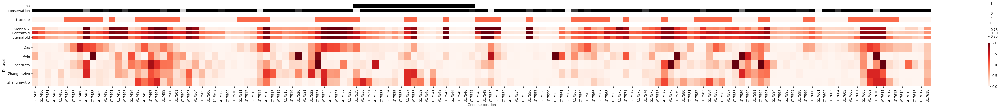

In [99]:
data1 = shape_norm_for_heatmap_mid5_das
data2 =shape_norm_for_heatmap_mid5_pyle
data3 =shape_norm_for_heatmap_mid5_incarnato
data4 = shape_norm_for_heatmap_mid5_zhang_invivo
data5 =shape_norm_for_heatmap_mid5_zhang_invitro
xaxis = xaxis_mid5
lna = mid5_lna
conservation = conservation_mid5
structure = structure_track_mid5
vienna_2 = punp_track_vienna_2_mid5
contrafold = punp_track_contrafold_mid5
eternafold = punp_track_eternafold_mid5

function_for_mid_heatmaps()

## MID6

In [100]:
#mid5: 17479:17618 [17478:17618]
shape_lines_mid6_incarnato = shape_lines_incarnato[17814:17954]
shape_norm_for_heatmap_mid6_incarnato=function_for_heatmap_data(shape_lines_mid6_incarnato)

shape_lines_mid6_pyle = shape_lines_pyle[17814:17954]
shape_norm_for_heatmap_mid6_pyle=function_for_heatmap_data(shape_lines_mid6_pyle)

shape_lines_mid6_zhang_invivo = shape_lines_zhang_invivo[17814:17954]
shape_norm_for_heatmap_mid6_zhang_invivo=function_for_heatmap_data(shape_lines_mid6_zhang_invivo)

shape_lines_mid6_zhang_invitro = shape_lines_zhang_invitro[17814:17954]
shape_norm_for_heatmap_mid6_zhang_invitro=function_for_heatmap_data(shape_lines_mid6_zhang_invitro)

In [101]:
#windowed data
shape_lines_mid6_das = new_import('mid6_vanya.csv')
shape_norm_for_heatmap_mid6_das=function_for_heatmap_data(shape_lines_mid6_das)

In [102]:
#xaxis
mid6_sequence = whole_genome[17814:17954]
position_mid6=list(range(17815,17955)) 

sequence_mid6_no_T = sequence_no_T(mid6_sequence)
xaxis_mid6 = [''.join([sequence_mid6_no_T[i], str(position_mid6[i])]) for i in range(0, len(sequence_mid6_no_T))]

In [103]:
#LNA
#mid6: 17815-17954 [17814:17954]
#LNA5: 17856-17874

LNA5 =list(range(17856,17875))
mid6_lna = suplot_lna_new(position_mid6,LNA5)


In [104]:
#Conservation
conservation_mid6 = conservation_floats[17814:17954]

In [105]:
#structure mid6
dot_bracket_mid6 = '................(((((.........(((((....(((((((((...))))))))).......)).))).)))))....((((.((((((..((((.......))))..)))))).))))................'
structure_track_mid6 = bp_func(dot_bracket_mid6)

In [106]:
#punp for mid6: 17815:17954 [17814:17954]

punp_track_vienna_2_mid6 = punp_track_vienna_2[17814:17954]
print(punp_track_vienna_2_mid6)
punp_track_contrafold_mid6 = punp_track_contrafold[17814:17954]
print(punp_track_contrafold_mid6)
punp_track_eternafold_mid6 = punp_track_eternafold[17814:17954]
print(punp_track_eternafold_mid6)

[0.00327, 0.280912, 0.996401, 0.529775, 0.513671, 0.517138, 0.275757, 0.466551, 0.44885, 0.563173, 0.6329, 0.734705, 0.608521, 0.652234, 0.771339, 0.836424, 0.268676, 0.253321, 0.039562, 0.181492, 0.276749, 0.357495, 0.624408, 0.895047, 0.908918, 0.656321, 0.6547, 0.487124, 0.748979, 0.432357, 0.413941, 0.387968, 0.03871, 0.072176, 0.153131, 0.31576, 0.442757, 0.840063, 0.85693, 0.003286, 0.006981, 0.002864, 0.001245, 0.001067, 0.000828, 5.2e-05, 0.002682, 0.022334, 1.0, 1.0, 1.0, 0.022334, 0.002682, 5.2e-05, 0.000828, 0.001067, 0.001285, 0.002866, 0.007111, 0.034206, 0.997161, 0.986148, 0.53698, 0.489061, 0.560815, 0.997968, 0.999091, 0.973491, 0.975104, 0.992545, 0.83855, 0.260402, 0.168827, 0.390271, 0.986869, 0.994402, 0.832544, 0.452069, 0.340424, 0.472302, 0.389977, 0.456454, 0.886325, 0.536962, 0.253293, 0.113257, 0.133081, 0.679125, 0.004091, 0.027464, 0.331292, 0.032219, 0.044845, 0.076064, 0.622139, 0.74639, 0.163851, 0.134085, 0.009832, 0.028472, 0.672813, 0.997035, 0.8953, 

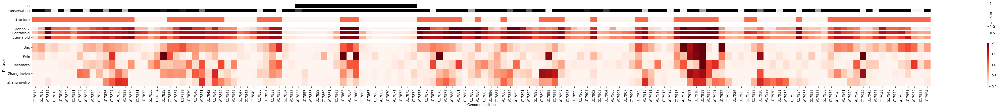

In [107]:
data1 = shape_norm_for_heatmap_mid6_das
data2 =shape_norm_for_heatmap_mid6_pyle
data3 =shape_norm_for_heatmap_mid6_incarnato
data4 = shape_norm_for_heatmap_mid6_zhang_invivo
data5 =shape_norm_for_heatmap_mid6_zhang_invitro
xaxis = xaxis_mid6
lna = mid6_lna
conservation = conservation_mid6
structure = structure_track_mid6
vienna_2 = punp_track_vienna_2_mid6
contrafold = punp_track_contrafold_mid6
eternafold = punp_track_eternafold_mid6

function_for_mid_heatmaps()

## 3'UTR

In [108]:
#3'UTR 29542:29903
shape_lines_3utr_incarnato = shape_lines_incarnato[29542:29903]
shape_norm_for_heatmap_3utr_incarnato=function_for_heatmap_data(shape_lines_3utr_incarnato)

shape_lines_3utr_pyle= shape_lines_pyle[29542:29903]
shape_norm_for_heatmap_3utr_pyle=function_for_heatmap_data(shape_lines_3utr_pyle)

shape_lines_3utr_zhang_invivo= shape_lines_zhang_invivo[29542:29903]
shape_norm_for_heatmap_3utr_zhang_invivo=function_for_heatmap_data(shape_lines_3utr_zhang_invivo)

shape_lines_3utr_zhang_invitro= shape_lines_zhang_invitro[29542:29903]
shape_norm_for_heatmap_3utr_zhang_invitro=function_for_heatmap_data(shape_lines_3utr_zhang_invitro)



In [109]:
#xaxis
sequence_3utr = whole_genome[29542:29903]
position_3utr=list(range(29543,29904))

sequence_3utr_no_T = sequence_no_T(sequence_3utr)
xaxis_3utr = [''.join([sequence_3utr_no_T[i], str(position_3utr[i])]) for i in range(0, len(sequence_3utr_no_T))]


In [110]:
#function for lna subplot 3utr specific
def suplot_lna_3utr(position,LNA10,LNA11,LNA13,LNA16):
    new_number=[]
    for number in position:
        if number==number in LNA10:
            new_number.append(1)
        elif number == number in LNA11:
            new_number.append(1)
        elif number == number in LNA13:
            new_number.append(1)
        elif number == number in LNA16:
            new_number.append(1)
        else:
            new_number.append(0)
    return new_number

In [111]:
#LNA
# 3utr: 29543- 29903 [29542:29903]
"""LNA10: 29732-29755
LNA11:29651-29685
LNA13:29785-29827
LNA16: 29688-29705"""

LNA10 =list(range(29732,29756))
LNA11 =list(range(29651,29686))
LNA13 =list(range(29785,29828))
LNA16 =list(range(29688,29706))

lna_3utr= suplot_lna_3utr(position_3utr,LNA10,LNA11,LNA13,LNA16)

In [112]:
#Conservation
conservation_3utr = conservation_floats[29542:29903]

In [113]:
#structure mid3utr
structure_3utr= '................(((((((((((..(((...((......))...))).)))))))))))..(((((((.......{{{{{{.[[[[[[[[[.)))))))...]]]]]]]]]...((((..((((((((((..((..(((.(((.....(((((((((.((.(((....)))))....(((((((((....((..((((.....))..))...))...))))).)))).((((........))))..........))))))))).....))).)))..))...)))))......)))))..))))...........}}}}}}....................................'
structure_track_3utr= bp_func(structure_3utr)

In [114]:
#punp for 3utr range: 29543-29903 [29542:29903]
punp_track_vienna_2_3utr = punp_track_vienna_2[29542:29903]
print(punp_track_vienna_2_3utr)
punp_track_contrafold_3utr = punp_track_contrafold[29542:29903]
print(punp_track_contrafold_3utr)
punp_track_eternafold_3utr = punp_track_eternafold[29542:29903]
print(punp_track_eternafold_3utr)

[0.511165, 0.809274, 0.72871, 0.719382, 0.931063, 0.628296, 0.656104, 0.597609, 0.609358, 0.525865, 0.385214, 0.337132, 0.558108, 0.43225, 0.275422, 0.806934, 0.414962, 0.369341, 0.089981, 0.138192, 0.228263, 0.144839, 0.110519, 0.10208, 0.1071, 0.089708, 0.184277, 0.90432, 0.931287, 0.052795, 0.035178, 0.11581, 0.970771, 0.979651, 0.98698, 0.18392, 0.133439, 0.897628, 0.948445, 0.95641, 0.975446, 0.969649, 0.965187, 0.170151, 0.035734, 0.844713, 0.897892, 0.914799, 0.103419, 0.110261, 0.107459, 0.944668, 0.159216, 0.121724, 0.113304, 0.118086, 0.148649, 0.210996, 0.186327, 0.20169, 0.177291, 0.49735, 0.578773, 0.419996, 0.384036, 0.46218, 0.454065, 0.104682, 0.023534, 0.010153, 0.013887, 0.865418, 0.266433, 0.203375, 0.330449, 0.72919, 0.230078, 0.197255, 0.281518, 0.520521, 0.900878, 0.802616, 0.853529, 0.688822, 0.799437, 0.579372, 0.206657, 0.387967, 0.407716, 0.316014, 0.317014, 0.393594, 0.32376, 0.344933, 0.347235, 0.938275, 0.318053, 0.353539, 0.856437, 0.827778, 0.833442, 0.90

In [115]:
#New heatmap function for 3'utr since there is 4 dataset (not 5 like the mid regions)
def function_for_3utr_heatmaps():
    data = np.array([data1, data2, data3, data4]) # First make a numpy array with your data

    # Move the data from a numpy array to a DataFrame with row and column labels
    data_df = pd.DataFrame(data=data, \
                index=["Pyle", "Incarnato", "Zhang-invivo", "Zhang-invitro"], \
                columns=xaxis)
    mask = data_df.isnull() # Create a mask for all the "nan" values

    # Now on to making the plot!
    color_map = plt.cm.get_cmap('Reds') # Set up color scheme
    color_map.set_bad("whitesmoke") # nan values will now be gray

    fig,ax = plt.subplots(4, 1, gridspec_kw={'height_ratios': [1.1, .7, 1.5, 5]},figsize=(60, 5))

    #LNA and conservation track
    lna_conservation_data = np.array([lna, conservation]) 
    lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
                index=["lna", "conservation"], \
                columns=xaxis)
    fig.subplots_adjust(wspace=0.01)
    lna_conserv_heatmap= sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
    for i in range(lna_conservation_data_df.shape[0] + 1):
        ax[0].axhline(i, color='white', lw=4)
    lna_conserv_heatmap.set_yticklabels(lna_conserv_heatmap.get_yticklabels(),va='center', rotation=0)


    #Structure track
    structures_data = np.array([structure]) 
    structures_data_df = pd.DataFrame(data=structures_data, \
                index=["structure"], \
                columns=xaxis)

    fig.subplots_adjust(wspace=0.01)
    struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
    for i in range(structures_data_df.shape[0] + 1):
        ax[1].axhline(i, color='white', lw=4)
    struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)

    #New track:p(unp) track
    punp_data = np.array([vienna_2, contrafold, eternafold]) 
    punp_data_df = pd.DataFrame(data=punp_data, \
                index=["Vienna_2", "Contrafold", "Eternafold"], \
                columns=xaxis)
    fig.subplots_adjust(wspace=0.01)
    sns.heatmap(punp_data_df, cmap='Reds', ax=ax[2], xticklabels=False)
    for i in range(punp_data_df.shape[0] + 1):
        ax[2].axhline(i, color='white', lw=4)

    sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[3])
    heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
    plt.xlabel("Genome position") # X axis label
    plt.ylabel("Dataset") # Y axis label
    plt.gcf().subplots_adjust(bottom=0.19)

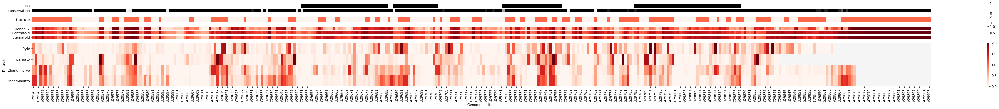

In [116]:
data1 =shape_norm_for_heatmap_3utr_pyle
data2 =shape_norm_for_heatmap_3utr_incarnato
data3 = shape_norm_for_heatmap_3utr_zhang_invivo
data4 =shape_norm_for_heatmap_3utr_zhang_invitro
xaxis = xaxis_3utr
lna = lna_3utr
conservation = conservation_3utr
structure = structure_track_3utr
vienna_2 = punp_track_vienna_2_3utr
contrafold = punp_track_contrafold_3utr
eternafold = punp_track_eternafold_3utr

function_for_3utr_heatmaps()

## Whole genome

In [117]:
#datasets
shape_lines_incarnato_whole_genome = shape_lines_incarnato
shape_norm_for_heatmap_incarnato_whole_genome =function_for_heatmap_data(shape_lines_incarnato_whole_genome)

shape_lines_pyle_whole_genome = shape_lines_pyle
shape_norm_for_heatmap_pyle_whole_genome =function_for_heatmap_data(shape_lines_pyle_whole_genome)

shape_lines_zhang_invivo_whole_genome = shape_lines_zhang_invivo
shape_norm_for_heatmap_zhang_invivo_whole_genome =function_for_heatmap_data(shape_lines_zhang_invivo_whole_genome)

shape_lines_zhang_invitro_whole_genome = shape_lines_zhang_invitro
shape_norm_for_heatmap_zhang_invitro_whole_genome = function_for_heatmap_data(shape_lines_zhang_invitro_whole_genome)


In [118]:
#xaxis
whole_genome
position_whole_genome=list(range(1,29904))


sequence_whole_genome_no_T = sequence_no_T(whole_genome)
xaxis_whole_genome = [''.join([sequence_whole_genome_no_T[i], str(position_whole_genome[i])]) for i in range(0, len(sequence_whole_genome_no_T))]
print(xaxis_whole_genome)

['A1', 'U2', 'U3', 'A4', 'A5', 'A6', 'G7', 'G8', 'U9', 'U10', 'U11', 'A12', 'U13', 'A14', 'C15', 'C16', 'U17', 'U18', 'C19', 'C20', 'C21', 'A22', 'G23', 'G24', 'U25', 'A26', 'A27', 'C28', 'A29', 'A30', 'A31', 'C32', 'C33', 'A34', 'A35', 'C36', 'C37', 'A38', 'A39', 'C40', 'U41', 'U42', 'U43', 'C44', 'G45', 'A46', 'U47', 'C48', 'U49', 'C50', 'U51', 'U52', 'G53', 'U54', 'A55', 'G56', 'A57', 'U58', 'C59', 'U60', 'G61', 'U62', 'U63', 'C64', 'U65', 'C66', 'U67', 'A68', 'A69', 'A70', 'C71', 'G72', 'A73', 'A74', 'C75', 'U76', 'U77', 'U78', 'A79', 'A80', 'A81', 'A82', 'U83', 'C84', 'U85', 'G86', 'U87', 'G88', 'U89', 'G90', 'G91', 'C92', 'U93', 'G94', 'U95', 'C96', 'A97', 'C98', 'U99', 'C100', 'G101', 'G102', 'C103', 'U104', 'G105', 'C106', 'A107', 'U108', 'G109', 'C110', 'U111', 'U112', 'A113', 'G114', 'U115', 'G116', 'C117', 'A118', 'C119', 'U120', 'C121', 'A122', 'C123', 'G124', 'C125', 'A126', 'G127', 'U128', 'A129', 'U130', 'A131', 'A132', 'U133', 'U134', 'A135', 'A136', 'U137', 'A138', 'A1

In [119]:
#Conservation
conservation_whole_genome = conservation_floats


In [120]:
#Datasets in 100 nucleotide windows
shape_norm_for_heatmap_pyle_whole_genome_frag =([shape_norm_for_heatmap_pyle_whole_genome[i:i+100] for i in range(0, len(shape_norm_for_heatmap_pyle_whole_genome), 100)])

shape_norm_for_heatmap_incarnato_whole_genome_frag =([shape_norm_for_heatmap_incarnato_whole_genome[i:i+100] for i in range(0, len(shape_norm_for_heatmap_incarnato_whole_genome), 100)])

shape_norm_for_heatmap_zhang_invivo_whole_genome_frag =([shape_norm_for_heatmap_zhang_invivo_whole_genome[i:i+100] for i in range(0, len(shape_norm_for_heatmap_zhang_invivo_whole_genome), 100)])

shape_norm_for_heatmap_zhang_invitro_whole_genome_frag =([shape_norm_for_heatmap_zhang_invitro_whole_genome[i:i+100] for i in range(0, len(shape_norm_for_heatmap_zhang_invitro_whole_genome), 100)])



In [121]:
#supplementary data in 100 nucleotide windows
xaxis_whole_genome_frag =([xaxis_whole_genome[i:i+100] for i in range(0, len(xaxis_whole_genome), 100)])
conservation_whole_genome_frag =([conservation_whole_genome[i:i+100] for i in range(0, len(conservation_whole_genome), 100)])
punp_track_vienna_2_frag = ([punp_track_vienna_2[i:i+100] for i in range(0, len(punp_track_vienna_2), 100)])
punp_track_contrafold_frag = ([punp_track_contrafold[i:i+100] for i in range(0, len(punp_track_contrafold), 100)])
punp_track_eternafold_frag =([punp_track_eternafold[i:i+100] for i in range(0, len(punp_track_eternafold), 100)])

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/matrix.py:203: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/matrix.py:208: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


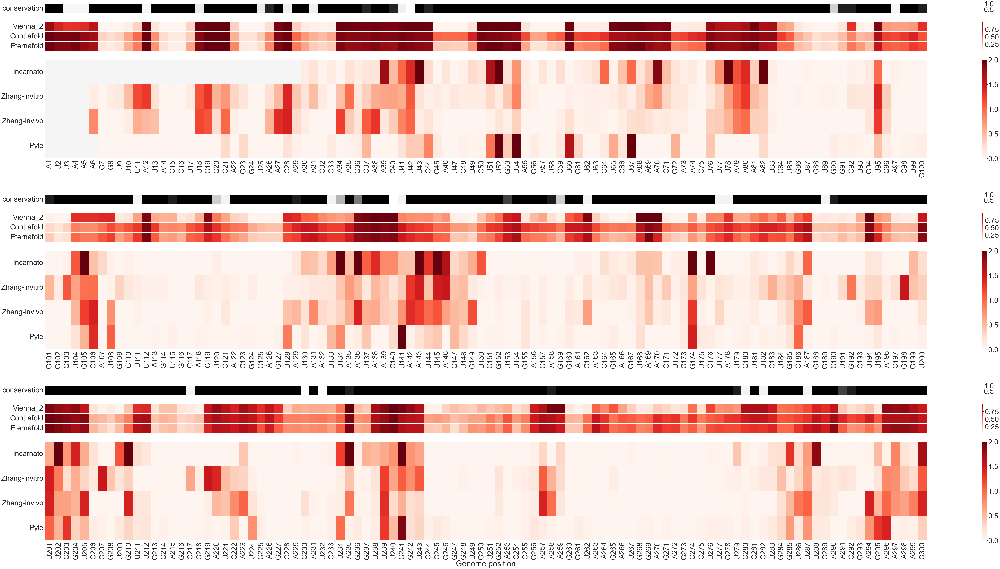

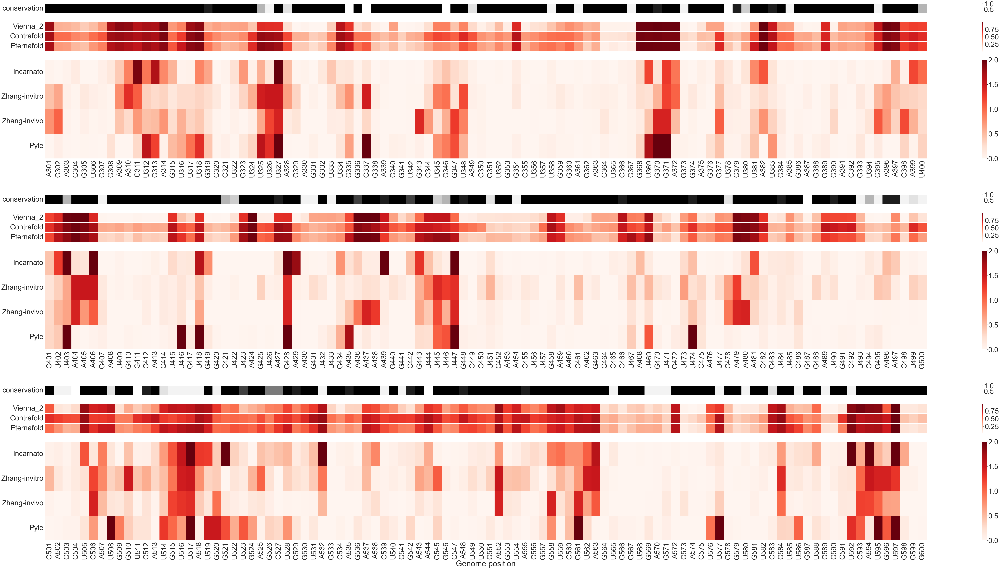

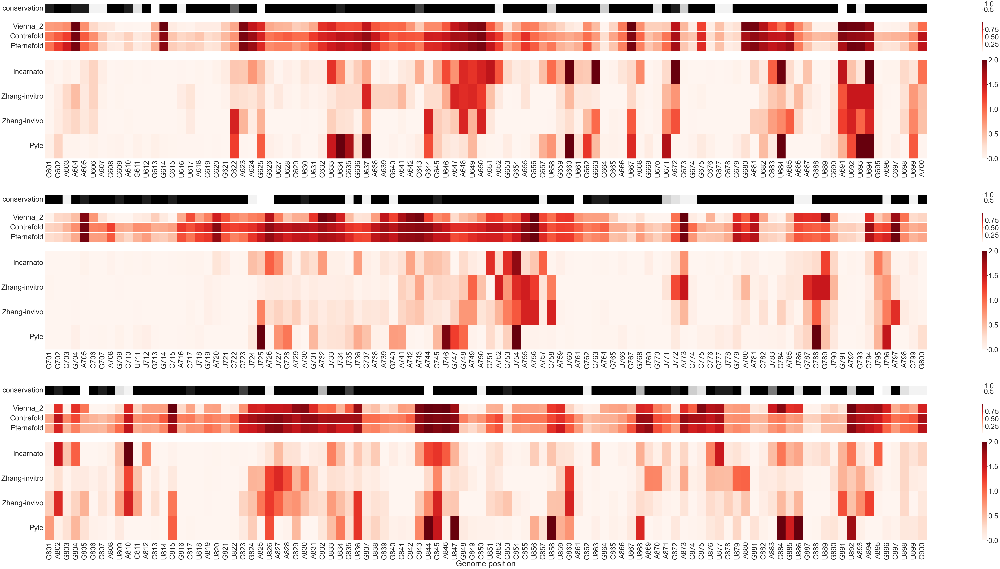

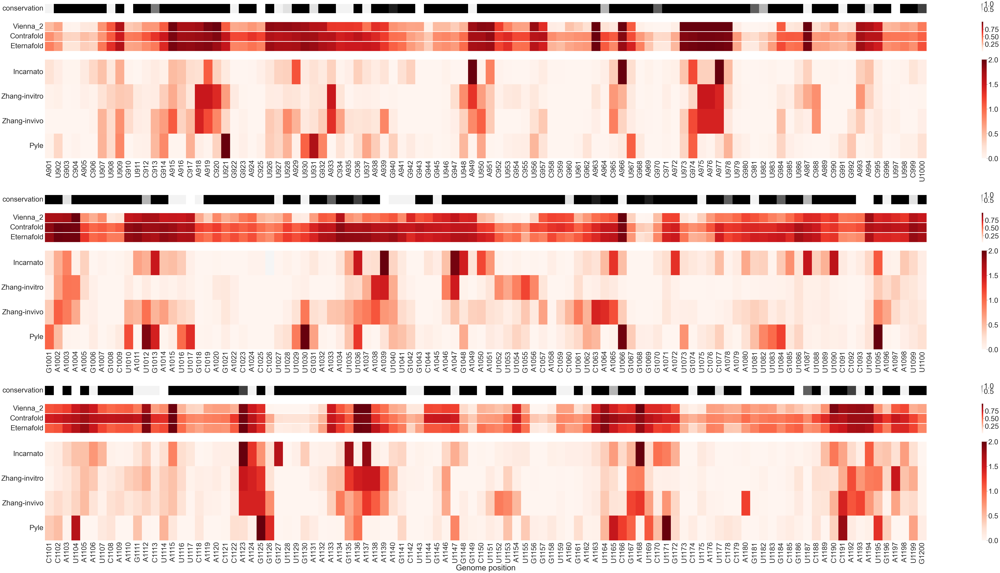

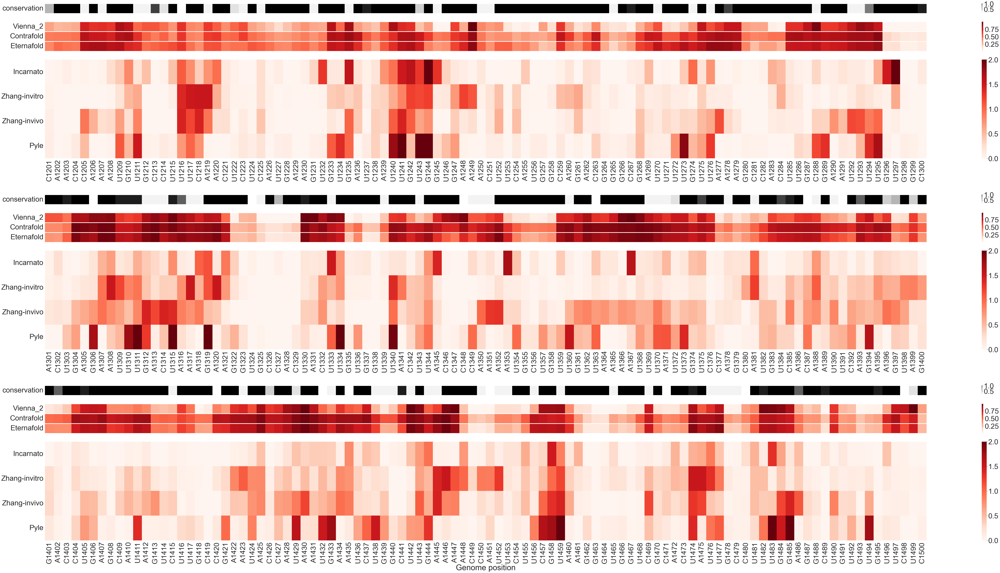

...

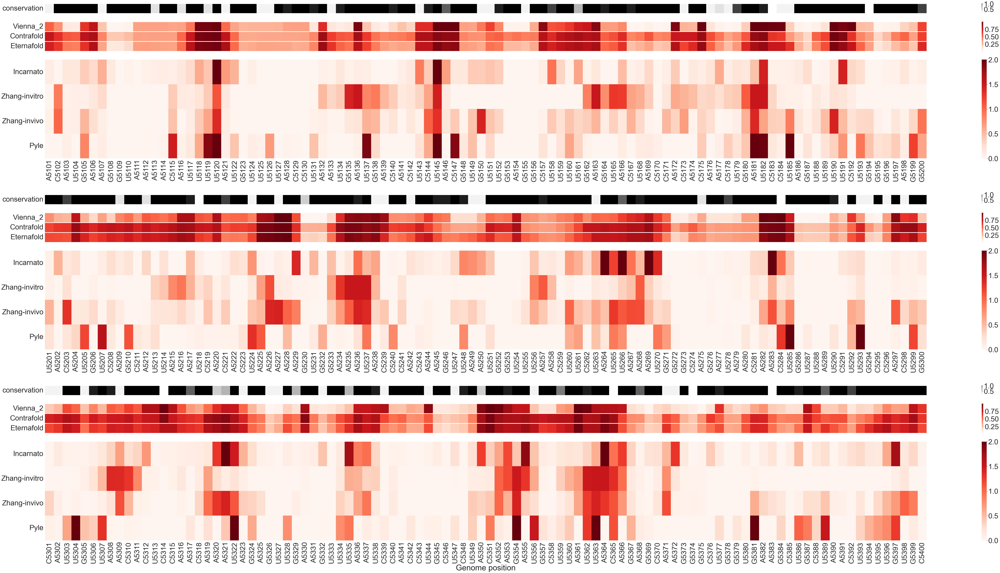

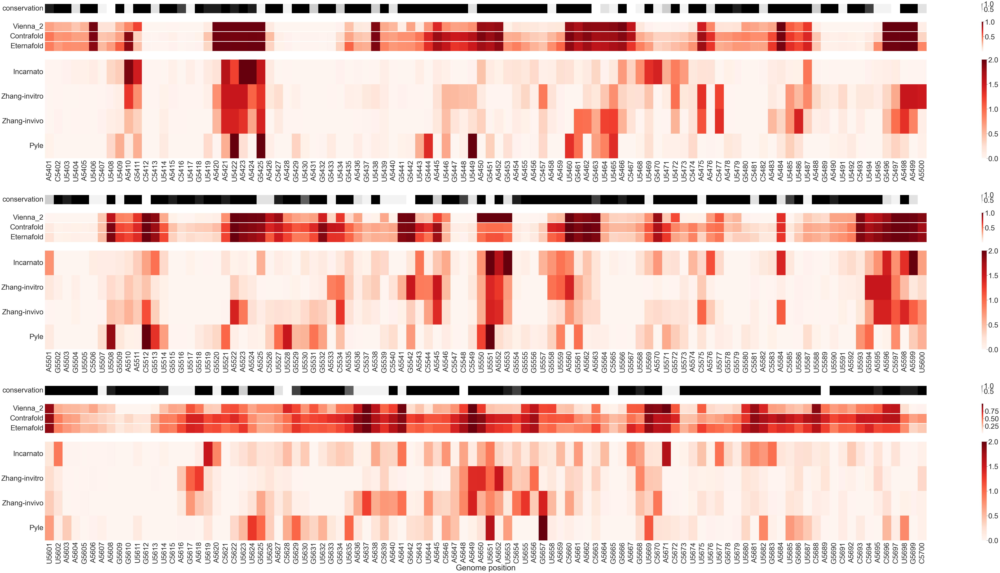

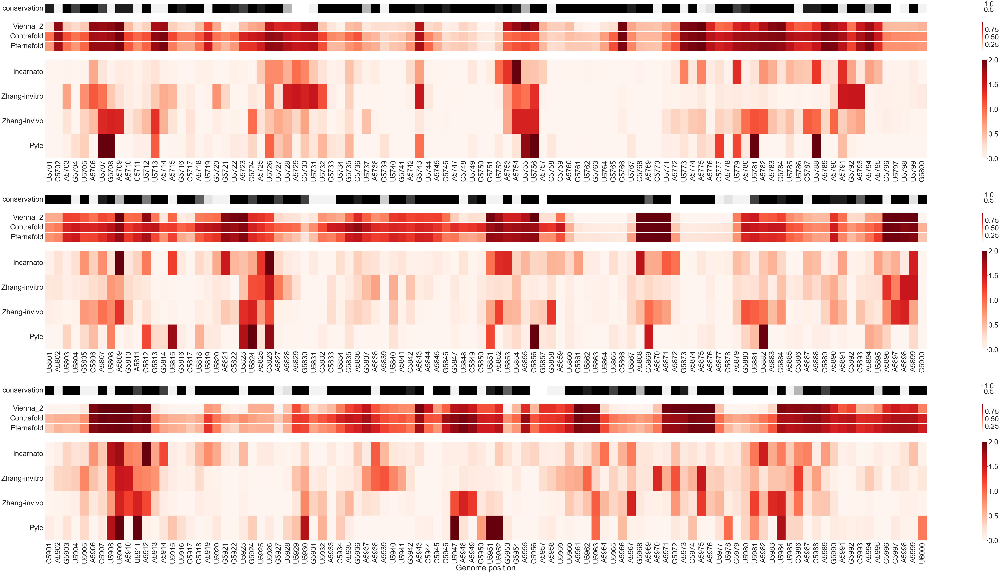

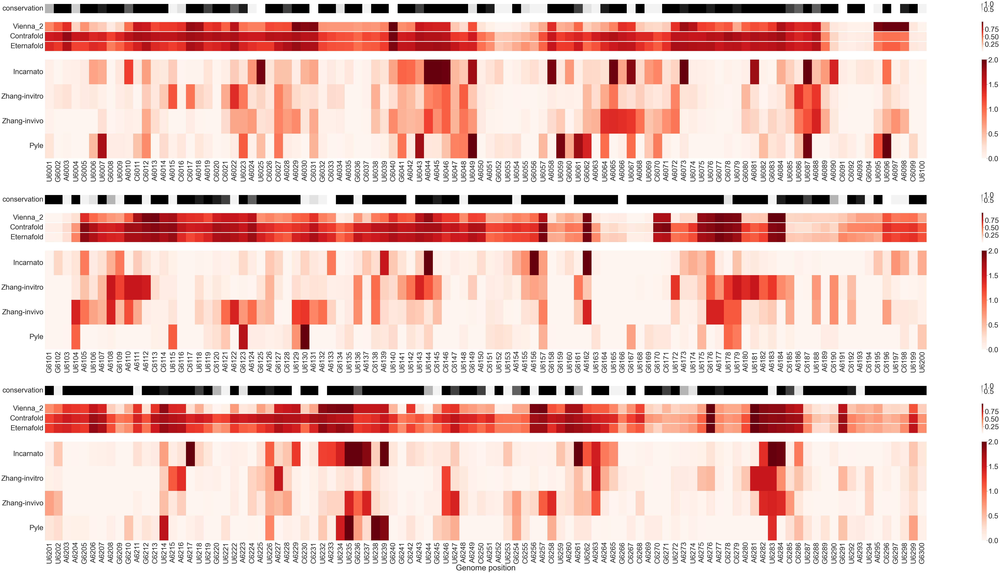

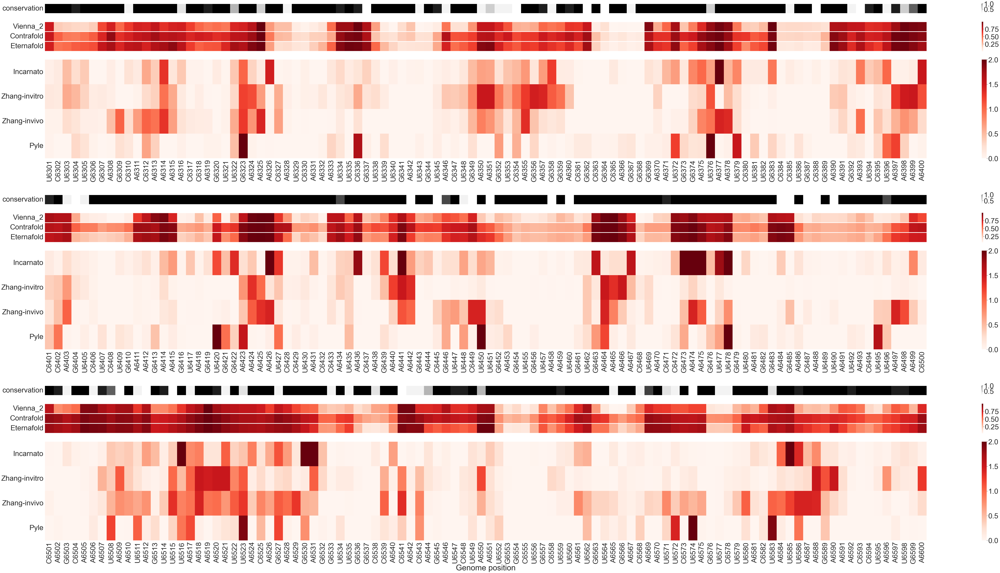

Error in callback <function flush_figures at 0x7fa363475598> (for post_execute):


KeyboardInterrupt: 

In [124]:
#heatmap for whole genome

import matplotlib as plt
plt.rcParams.update({'figure.max_open_warning': 0})

import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
pp = PdfPages('genome_wide_chemical_reactivity_comparison_updated.pdf')
sns.set(font_scale = 4)


for idx in range(0, len(shape_norm_for_heatmap_pyle_whole_genome_frag), 3):  
    data1a = shape_norm_for_heatmap_incarnato_whole_genome_frag[idx]
    data2a = shape_norm_for_heatmap_zhang_invitro_whole_genome_frag[idx]
    data3a = shape_norm_for_heatmap_zhang_invivo_whole_genome_frag[idx]
    data4a = shape_norm_for_heatmap_pyle_whole_genome_frag[idx]
   
    xaxisa = xaxis_whole_genome_frag[idx]
    conservationa = conservation_whole_genome_frag[idx]
    vienna_2a = punp_track_vienna_2_frag[idx]
    contrafolda = punp_track_contrafold_frag[idx]
    eternafolda = punp_track_eternafold_frag[idx]
    
    data1b = shape_norm_for_heatmap_incarnato_whole_genome_frag[idx+1]
    data2b = shape_norm_for_heatmap_zhang_invitro_whole_genome_frag[idx+1]
    data3b = shape_norm_for_heatmap_zhang_invivo_whole_genome_frag[idx+1]
    data4b = shape_norm_for_heatmap_pyle_whole_genome_frag[idx+1]
    xaxisb = xaxis_whole_genome_frag[idx+1]
    conservationb = conservation_whole_genome_frag[idx+1]
    vienna_2b = punp_track_vienna_2_frag[idx+1]
    contrafoldb = punp_track_contrafold_frag[idx+1]
    eternafoldb = punp_track_eternafold_frag[idx+1]
    
    data1c = shape_norm_for_heatmap_incarnato_whole_genome_frag[idx+2]
    data2c = shape_norm_for_heatmap_zhang_invitro_whole_genome_frag[idx+2]
    data3c = shape_norm_for_heatmap_zhang_invivo_whole_genome_frag[idx+2]
    data4c = shape_norm_for_heatmap_pyle_whole_genome_frag[idx+2]
    xaxisc = xaxis_whole_genome_frag[idx+2]
    conservationc = conservation_whole_genome_frag[idx+2]
    vienna_2c = punp_track_vienna_2_frag[idx+2]
    contrafoldc = punp_track_contrafold_frag[idx+2]
    eternafoldc = punp_track_eternafold_frag[idx+2]
    
    data_a = np.array([data1a, data2a, data3a, data4a]) # First make a numpy array with your data
    data_b = np.array([data1b, data2b, data3b, data4b]) # First make a numpy array with your data
    data_c = np.array([data1c, data2c, data3c, data4c]) # First make a numpy array with your data

    # Move the data from a numpy array to a DataFrame with row and column labels
    

    # Now on to making the plot!
    color_map = plt.cm.get_cmap('Reds') # Set up color scheme
    color_map.set_bad("whitesmoke") # nan values will now be gray

    
    fig,ax = plt.subplots(11, 1, gridspec_kw={'height_ratios': [.5, 1.5, 5, 1, .5, 1.5, 5, 1, .5, 1.5, 5]},figsize=(120, 60))
    fig.subplots_adjust(wspace=0.50)

    data_df_a = pd.DataFrame(data=data_a, \
                index=["Incarnato", "Zhang-invitro", "Zhang-invivo", "Pyle"], \
                columns=xaxisa)
    mask = data_df_a.isnull() # Create a mask for all the "nan" values

    # Now on to making the plot!
    color_map = plt.cm.get_cmap('Reds') # Set up color scheme
    color_map.set_bad("whitesmoke") # nan values will now be gray

    #LNA and conservation track
    lna_conservation_data_a = np.array([conservationa]) #add lna
    lna_conservation_data_df_a = pd.DataFrame(data=lna_conservation_data_a, \
                index=["conservation"], \
                columns=xaxisa)
    lna_conserv_heatmap_a = sns.heatmap(lna_conservation_data_df_a, cmap='Greys', ax=ax[0], xticklabels=False)
    for i in range(lna_conservation_data_df_a.shape[0] + 1):
        ax[0].axhline(i, color='white', lw=4)
    lna_conserv_heatmap_a.set_yticklabels(lna_conserv_heatmap_a.get_yticklabels(),va='center', rotation=0)

   
    #New track:p(unp) track
    punp_data_a = np.array([vienna_2a, contrafolda, eternafolda]) 
    punp_data_df_a = pd.DataFrame(data=punp_data_a, \
                index=["Vienna_2", "Contrafold", "Eternafold"], \
                columns=xaxisa)
    punp_heatmap_a = sns.heatmap(punp_data_df_a, cmap='Reds', ax=ax[1], xticklabels=False)
    for i in range(punp_data_df_a.shape[0] + 1):
        ax[1].axhline(i, color='white', lw=4)
    punp_heatmap_a.set_yticklabels(punp_heatmap_a.get_yticklabels(),va='center', rotation=0)

    

    shape_heatmap = sns.heatmap(data_df_a, mask=mask, cmap=color_map, ax=ax[2])
    heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
    shape_heatmap.set_yticklabels(shape_heatmap.get_yticklabels(),va='center', rotation=0)
    #ax[2].set_xlabel("Genome position")
    #ax[2].set_ylabel("Dataset")
    

    ax[3].remove()

    
    ### SECOND
    
     # Move the data from a numpy array to a DataFrame with row and column labels
    data_df_b = pd.DataFrame(data=data_b, \
                index=["Incarnato", "Zhang-invitro", "Zhang-invivo", "Pyle"], \
                columns=xaxisb)
    mask = data_df_b.isnull() # Create a mask for all the "nan" values

    #LNA and conservation track
    lna_conservation_data_b = np.array([conservationb])
    lna_conservation_data_df_b = pd.DataFrame(data=lna_conservation_data_b, \
                index=["conservation"], \
                columns=xaxisb)
    lna_conserv_heatmap_b = sns.heatmap(lna_conservation_data_df_b, cmap='Greys', ax=ax[4], xticklabels=False)
    for i in range(lna_conservation_data_df_b.shape[0] + 1):
        ax[4].axhline(i, color='white', lw=4)
    lna_conserv_heatmap_b.set_yticklabels(lna_conserv_heatmap_b.get_yticklabels(),va='center', rotation=0)

   
    #New track:p(unp) track
    punp_data_b = np.array([vienna_2b, contrafoldb, eternafoldb]) 
    punp_data_df_b = pd.DataFrame(data=punp_data_b, \
                index=["Vienna_2", "Contrafold", "Eternafold"], \
                columns=xaxisb)
    punp_heatmap_b = sns.heatmap(punp_data_df_b, cmap='Reds', ax=ax[5], xticklabels=False)
    for i in range(punp_data_df_b.shape[0] + 1):
        ax[5].axhline(i, color='white', lw=4)
    punp_heatmap_b.set_yticklabels(punp_heatmap_b.get_yticklabels(),va='center', rotation=0)


    shape_heatmap_b= sns.heatmap(data_df_b, mask=mask, cmap=color_map, ax=ax[6])
    heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
    shape_heatmap_b.set_yticklabels(shape_heatmap_b.get_yticklabels(),va='center', rotation=0)
    
    ax[7].remove()

    ##THIRD
    #Move the data from a numpy array to a DataFrame with row and column labels
    data_df_c = pd.DataFrame(data=data_c, \
                index=["Incarnato", "Zhang-invitro", "Zhang-invivo", "Pyle"], \
                columns=xaxisc)
    mask = data_df_c.isnull() # Create a mask for all the "nan" values

     #LNA and conservation track
        
    lna_conservation_data_c = np.array([conservationc]) #add lna
    lna_conservation_data_df_c = pd.DataFrame(data=lna_conservation_data_c, \
                index=["conservation"], \
                columns=xaxisc)
    lna_conserv_heatmap_c = sns.heatmap(lna_conservation_data_df_c, cmap='Greys', ax=ax[8], xticklabels=False)
    for i in range(lna_conservation_data_df_c.shape[0] + 1):
        ax[8].axhline(i, color='white', lw=4)
    lna_conserv_heatmap_c.set_yticklabels(lna_conserv_heatmap_c.get_yticklabels(),va='center', rotation=0)

   
    #New track:p(unp) track
    punp_data_c = np.array([vienna_2c, contrafoldc, eternafoldc]) 
    punp_data_df_c = pd.DataFrame(data=punp_data_c, \
                index=["Vienna_2", "Contrafold", "Eternafold"], \
                columns=xaxisc)
    punp_heatmap_c = sns.heatmap(punp_data_df_c, cmap='Reds', ax=ax[9], xticklabels=False)
    for i in range(punp_data_df_c.shape[0] + 1):
        ax[9].axhline(i, color='white', lw=4)
    punp_heatmap_c.set_yticklabels(punp_heatmap_c.get_yticklabels(),va='center', rotation=0)

    shape_heatmap_c = sns.heatmap(data_df_c, mask=mask, cmap=color_map, ax=ax[10])
    heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
    plt.xlabel("Genome position") # X axis label
    #plt.ylabel("Dataset") # Y axis label
    shape_heatmap_c.set_yticklabels(shape_heatmap_c.get_yticklabels(),va='center', rotation=0)
    
    pp.savefig(bbox_inches='tight')
pp.close()

## RNAz strucuture comparison

In [139]:
rnaz_structured_predictions_lines= new_import('rnaz_structured_predictions.csv') 
print(rnaz_structured_predictions_lines)

['\ufeff1,120,AUUAAAGGUUUAUACCUUCCCAGGUAACAAACCAACCAACUUUCGAUCUCUUGUAGAUCUGUUCUCUAAACGAACUUUAAAAUCUGUGUGGCUGUCACUCGGCUGCAUGCUUAGUGCACU,......(((((.(((((....)))))..)))))...........(((((.....))))).((((.......))))..........(((..((((.....))))..)))((.....))...,-2.13,0.654132\n', '41,158,UUUCGAUCUCUUGUAGAUCUGUUCUCUAAACGAACUUUAAAAUCUGUGUGGCUGUCACUCGGCUGCAUGCUUAGUGCACUCACGCAGUAUAAUUAAUAACUAAUUACUGUCGUUGACA,....(((((.....))))).........(((((..........(((((((..((.((((.(((.....))).))))))..)))))))..((((((.....))))))...)))))....,-2.91,0.998151\n', '81,198,AAUCUGUGUGGCUGUCACUCGGCUGCAUGCUUAGUGCACUCACGCAGUAUAAUUAAUAACUAAUUACUGUCGUUGACAGGACACGAGUAACUCGUCUAUCUUCUGCAGGCUGCUUACG,...(((((((..((.((((.(((.....))).))))))..)))))))..((((((.....))))))..((.(((..(((((.(((((...))))).....)))))..))).)).....,-0.8,0.989529\n', '121,238,CACGCAGUAUAAUUAAUAACUAAUUACUGUCGUUGACAGGACACGAGUAACUCGUCUAUCUUCUGCAGGCUGCUUACGGUUUCGUCCGUGUUGCAGCCGAUCAUCAGCACAUCUAGGU,...((((((..((((.....)))))))))).((((((((((.(((((...))))).....)))))..(

In [140]:
rnaz_start=([rnaz_structured_predictions_lines[i].split(',')[0] for i in range(0, len(rnaz_structured_predictions_lines))])

print(rnaz_start)

['\ufeff1', '41', '81', '121', '159', '319', '399', '639', '719', '839', '919', '1119', '1159', '1199', '1239', '1559', '1599', '1639', '1719', '2119', '2159', '2319', '2479', '2519', '2707', '2744', '2904', '2944', '3095', '3372', '3492', '3809', '4055', '4095', '4135', '4175', '4215', '4295', '4415', '4535', '4575', '4815', '4932', '4972', '5012', '5052', '5092', '5212', '5252', '5292', '5332', '5452', '5652', '5692', '5732', '6012', '6092', '6132', '6212', '6252', '6412', '6452', '6612', '6972', '7012', '7052', '7132', '7172', '7452', '7772', '8092', '8132', '8292', '8691', '8811', '8851', '9211', '9251', '9371', '9411', '9611', '10131', '10371', '10411', '10451', '10851', '10931', '10971', '11011', '11051', '11091', '11211', '11651', '11691', '11731', '11771', '12171', '12371', '12571', '12611', '12691', '12891', '13330', '13370', '13410', '13647', '13687', '13807', '13887', '13927', '14007', '14047', '14087', '14127', '14207', '14367', '14447', '14527', '14687', '14727', '14767', 

In [141]:
#making '\ufeff1' = 1
rnaz_start_adjusted= []
for number in rnaz_start:
    if number == '\ufeff1':
        rnaz_start_adjusted.append(1)
    else:
            rnaz_start_adjusted.append(number)   
rnaz_start_integers=[int(i) for i in rnaz_start_adjusted]
print(rnaz_start_integers)

[1, 41, 81, 121, 159, 319, 399, 639, 719, 839, 919, 1119, 1159, 1199, 1239, 1559, 1599, 1639, 1719, 2119, 2159, 2319, 2479, 2519, 2707, 2744, 2904, 2944, 3095, 3372, 3492, 3809, 4055, 4095, 4135, 4175, 4215, 4295, 4415, 4535, 4575, 4815, 4932, 4972, 5012, 5052, 5092, 5212, 5252, 5292, 5332, 5452, 5652, 5692, 5732, 6012, 6092, 6132, 6212, 6252, 6412, 6452, 6612, 6972, 7012, 7052, 7132, 7172, 7452, 7772, 8092, 8132, 8292, 8691, 8811, 8851, 9211, 9251, 9371, 9411, 9611, 10131, 10371, 10411, 10451, 10851, 10931, 10971, 11011, 11051, 11091, 11211, 11651, 11691, 11731, 11771, 12171, 12371, 12571, 12611, 12691, 12891, 13330, 13370, 13410, 13647, 13687, 13807, 13887, 13927, 14007, 14047, 14087, 14127, 14207, 14367, 14447, 14527, 14687, 14727, 14767, 14847, 14887, 14967, 15007, 15607, 15646, 16446, 16486, 16766, 17086, 17126, 17166, 17206, 17326, 17366, 17446, 17526, 17766, 17846, 17966, 18646, 18686, 18806, 18846, 18926, 19046, 19166, 19206, 19366, 19406, 19446, 19646, 19766, 19926, 19966, 202

In [142]:
rnaz_end=([rnaz_structured_predictions_lines[i].split(',')[1] for i in range(0, len(rnaz_structured_predictions_lines))])
#print(rnaz_end)
rnaz_end_integers=[int(i) for i in rnaz_end]
print(rnaz_end_integers)

[120, 158, 198, 238, 278, 438, 518, 758, 838, 958, 1038, 1238, 1278, 1318, 1358, 1678, 1718, 1758, 1838, 2238, 2278, 2438, 2586, 2626, 2823, 2863, 3023, 3063, 3211, 3491, 3608, 3898, 4174, 4214, 4254, 4294, 4334, 4414, 4534, 4654, 4694, 4931, 5051, 5091, 5131, 5171, 5211, 5331, 5371, 5411, 5451, 5571, 5771, 5811, 5851, 6131, 6211, 6251, 6331, 6371, 6531, 6571, 6731, 7091, 7131, 7171, 7251, 7291, 7571, 7891, 8211, 8251, 8411, 8810, 8930, 8970, 9330, 9370, 9490, 9530, 9730, 10250, 10490, 10530, 10570, 10970, 11050, 11090, 11130, 11170, 11210, 11330, 11770, 11810, 11850, 11890, 12290, 12490, 12690, 12730, 12810, 13010, 13449, 13488, 13528, 13766, 13806, 13926, 14006, 14046, 14126, 14166, 14206, 14246, 14326, 14486, 14566, 14646, 14806, 14846, 14886, 14966, 15006, 15086, 15126, 15725, 15765, 16565, 16605, 16885, 17205, 17245, 17285, 17325, 17445, 17485, 17565, 17645, 17885, 17965, 18085, 18765, 18805, 18925, 18965, 19045, 19165, 19285, 19325, 19485, 19525, 19565, 19765, 19885, 20045, 20085

In [143]:
rnaz_struct=([rnaz_structured_predictions_lines[i].split(',')[3] for i in range(0, len(rnaz_structured_predictions_lines))])
print(rnaz_struct)

['......(((((.(((((....)))))..)))))...........(((((.....))))).((((.......))))..........(((..((((.....))))..)))((.....))...', '....(((((.....))))).........(((((..........(((((((..((.((((.(((.....))).))))))..)))))))..((((((.....))))))...)))))....', '...(((((((..((.((((.(((.....))).))))))..)))))))..((((((.....))))))..((.(((..(((((.(((((...))))).....)))))..))).)).....', '...((((((..((((.....)))))))))).((((((((((.(((((...))))).....)))))..((((((.(((((......)))))..)))))).....)))))..........', '.....((((...(((.((((((((.....((((((.(((((......)))))..)))))).........(((((((.((......)))))))))(((....)))))))))))))).))))', '.....((((((((((.(((((.((((..(.(((((.(((((((((((((.....))).)))))..))))).))))))..((((.....))))))))))))))))).))))))........', '........((((((((.((.((((..((..(((((((....(((.....))))))))))..)))))).)).))).))))).(((((((((....))))))((.(((....))))).))).', '....((((....(((((..(((((.(((.((((.((.((((......(((((....))))).)))).)))))))))))))).))))).((((....)))).....))))...........', '.........(((

In [144]:
def rna_struct_shape(sequence,current_shape_signal):
    
    print(current_shape_signal)
    print(sequence)
    rna_struct = mfe(sequence, package='rnastructure', T=24, shape_signal=current_shape_signal)
    return rna_struct

In [145]:
def percent_similarity_novo(genomic_shape,windowed_shape):
    struct_sim= []
    for idx in range(0, len(genomic_shape)):
        if genomic_shape[idx]== windowed_shape[idx]:
            struct_sim.append(1)
        else:
            struct_sim.append(0)
    print(struct_sim)
    a=sum(struct_sim)
    #print('Amount of similar bases:', +sum(struct_sim))
    print('Total bases:', +len(struct_sim))
    percentage_same = (sum(struct_sim))/(len(genomic_shape))
    return percentage_same

In [159]:
def shape_float(all_shape_lines):
    all_shape_lines_no_nan = []
    for number in all_shape_lines:
        if number == 'nan\n':
            all_shape_lines_no_nan.append(-999)
        else:
            all_shape_lines_no_nan.append(number)
    
    float_lines=[float(i) for i in all_shape_lines_no_nan]
    return float_lines

In [161]:
## Incarnato data

['nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 'nan\n',
 '0.136\n',
 '0.254\n',
 '0.033\n',
 '0.148\n',
 '0.012\n',
 '0.273\n',
 '0.141\n',
 '0.226\n',
 '0.224\n',
 '2.206\n',
 '0.631\n',
 '1.266\n',
 '1.714\n',
 '2.612\n',
 '0.356\n',
 '0.0\n',
 '0.25\n',
 '0.002\n',
 '0.065\n',
 '0.353\n',
 '0.262\n',
 '2.096\n',
 '2.613\n',
 '0.259\n',
 '0.929\n',
 '0.119\n',
 '0.0\n',
 '0.25\n',
 '0.007\n',
 '0.311\n',
 '0.0\n',
 '0.099\n',
 '0.183\n',
 '0.307\n',
 '1.254\n',
 '0.058\n',
 '0.57\n',
 '1.247\n',
 '0.252\n',
 '0.529\n',
 '2.332\n',
 '0.586\n',
 '0.249\n',
 '0.088\n',
 '0.165\n',
 '0.0\n',
 '0.387\n',
 '0.969\n',
 '3.621\n',
 '1.423\n',
 '1.717\n',
 '0.466\n',
 '2.525\n',
 '0.122\n',
 '0.017\n',
 '0.017\n',
 '0.0\n',
 '0.046\n',
 '0.0\n',
 '0.023\n',
 '0.0

In [162]:
#Make the list into floats 
float_lines_incarnato= shape_float(shape_lines_incarnato)

In [154]:
incarnato_tuples=[]
for idx in range(len(rnaz_structured_predictions_lines)):
    sequence=whole_genome[(rnaz_start_integers[idx]-1):rnaz_end_integers[idx]]
    current_shape_signal =float_lines_incarnato[(rnaz_start_integers[idx]-1):rnaz_end_integers[idx]]
    
    mfe_rnastructure= mfe(sequence, package='rnastructure', T=24, shape_signal=current_shape_signal)
    print('MFE(incarnato) with SHAPE signal:\n%s' % mfe_rnastructure)
    print(rnaz_struct[idx])
    cur_percent = percent_similarity_novo(mfe_rnastructure,rnaz_struct[idx])
    print(cur_percent)# same to list
    incarnato_tuples += [(rnaz_start_integers[idx], rnaz_end_integers[idx], cur_percent)]
   



MFE(incarnato) with SHAPE signal:
......(((((.(((((....)))))..)))))..(((......(((((.....))))).((((.......)))).............))).((.((((.(((.....))).))))))..
......(((((.(((((....)))))..)))))...........(((((.....))))).((((.......))))..........(((..((((.....))))..)))((.....))...
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1]
Total bases: 120
0.7666666666666667
MFE(incarnato) with SHAPE signal:
....(((((.....))))).((((.......))))........((((((((.((.((((.(((.....))).)))))).))))))))....................((((...))))
....(((((.....))))).........(((((..........(((((((..((.((((.(((.....))).))))))..)))))))..((((((.....))))))...)))))....
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [ ]:
f = open('incarnato_data_for_ramya.txt', 'w')
for incarnato_tuples in incarnato_tuples:
    f.write("%f,%f,%f\n" % incarnato_tuples)
f.close()

# Pyle

In [165]:
float_lines_pyle=shape_float(shape_lines_pyle)

In [168]:
pyle_tuples=[]
for idx in range(len(rnaz_structured_predictions_lines)):
    sequence=whole_genome[(rnaz_start_integers[idx]-1):rnaz_end_integers[idx]]
    current_shape_signal =float_lines_pyle[(rnaz_start_integers[idx]-1):rnaz_end_integers[idx]]
    
    mfe_rnastructure= mfe(sequence, package='rnastructure', T=24, shape_signal=current_shape_signal)
    print('MFE(pyle) with SHAPE signal:\n%s' % mfe_rnastructure)
    print(rnaz_struct[idx])
    cur_percent = percent_similarity_novo(mfe_rnastructure,rnaz_struct[idx])
    print(cur_percent)# same to list
    pyle_tuples += [(rnaz_start_integers[idx], rnaz_end_integers[idx], cur_percent)]

MFE(pyle) with SHAPE signal:
......(((((.(((((....)))))..)))))..(((((....(((((.....))))).((((.......))))..........)).))).((.((((.(((.....))).))))))..
......(((((.(((((....)))))..)))))...........(((((.....))))).((((.......))))..........(((..((((.....))))..)))((.....))...
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1]
Total bases: 120
0.75
MFE(pyle) with SHAPE signal:
....(((((.....))))).((((.......))))......((((((((((.((.((((.(((.....))).)))))).)))))))).))...((((.....)))).((((...))))
....(((((.....))))).........(((((..........(((((((..((.((((.(((.....))).))))))..)))))))..((((((.....))))))...)))))....
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 

In [ ]:
f = open('pyle_data_for_ramya.txt', 'w')
for pyle_tuples in pyle_tuples:
    f.write("%f,%f,%f\n" % pyle_tuples)
f.close()

# Zhang-invivo

In [171]:
float_lines_zhang_invivo=shape_float(shape_lines_zhang_invivo)

In [ ]:
zhang_invivo_tuples=[]
for idx in range(len(rnaz_structured_predictions_lines)):
    sequence=whole_genome[(rnaz_start_integers[idx]-1):rnaz_end_integers[idx]]
    current_shape_signal =float_lines_zhang_invivo[(rnaz_start_integers[idx]-1):rnaz_end_integers[idx]]
    
    mfe_rnastructure= mfe(sequence, package='rnastructure', T=24, shape_signal=current_shape_signal)
    print('MFE(pyle) with SHAPE signal:\n%s' % mfe_rnastructure)
    print(rnaz_struct[idx])
    cur_percent = percent_similarity_novo(mfe_rnastructure,rnaz_struct[idx])
    print(cur_percent)# same to list
    zhang_invivo_tuples += [(rnaz_start_integers[idx], rnaz_end_integers[idx], cur_percent)]

MFE(pyle) with SHAPE signal:
(((((.(((((.(((((....)))))..)))))...........(((((.....))))).((((.......)))).........((((((((((.....)))))))))).))))).....
......(((((.(((((....)))))..)))))...........(((((.....))))).((((.......))))..........(((..((((.....))))..)))((.....))...
[0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]
Total bases: 120
0.8416666666666667
MFE(pyle) with SHAPE signal:
....(((((.....))))).((((.......))))......((((((((((.((.((((.(((.....))).)))))).)))))))).))..(((((.((........)).)))))..
....(((((.....))))).........(((((..........(((((((..((.((((.(((.....))).))))))..)))))))..((((((.....))))))...)))))....
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0

In [ ]:
f = open('zhang_invivo_data_for_ramya.txt', 'w')
for zhang_invivo_tuples in zhang_invivo_tuples:
    f.write("%f,%f,%f\n" % zhang_invivo_tuples)
f.close()

# Zhang-Invitro

In [170]:
float_lines_zhang_invitro=shape_float(shape_lines_zhang_invitro) 

In [ ]:
zhang_invitro_tuples=[]
for idx in range(len(rnaz_structured_predictions_lines)):
    sequence=whole_genome[(rnaz_start_integers[idx]-1):rnaz_end_integers[idx]]
    current_shape_signal =float_lines_zhang_invitro[(rnaz_start_integers[idx]-1):rnaz_end_integers[idx]]
    
    mfe_rnastructure= mfe(sequence, package='rnastructure', T=24, shape_signal=current_shape_signal)
    print('MFE(pyle) with SHAPE signal:\n%s' % mfe_rnastructure)
    print(rnaz_struct[idx])
    cur_percent = percent_similarity_novo(mfe_rnastructure,rnaz_end_integers[idx])
    print(cur_percent)# same to list
    zhang_invitro_tuples += [(rnaz_start_integers[idx], rnaz_end_integers[idx], cur_percent)]

In [ ]:
f = open('zhang_invitro_data_for_ramya.txt', 'w')
for zhang_invitro_tuples in zhang_invitro_tuples:
    f.write("%f,%f,%f\n" % zhang_invitro_tuples)
f.close()

In [ ]:
#mid4
rna_struct_shape(whole_genome[10423:10555],float_lines_pyle[10423:10555])

In [ ]:
seq_1 = 'GGTGTTTACCAATGTGCTATGAGGCCCAATTTCACTATTAAGGGTTCATTCCTTAATGGTTCATGTGGTAGTGTTGGTTTTAACATAGATTATGACTGTGTCTCTTTTTGTTACATGCACC'

In [ ]:
dot_1 ='(((((..((((((...(((......(((.....(((((((((((.....))))))))))).....)))))).))))))....((((((.......))))))...............)))))'

In [ ]:
print(len(seq_1))
print(len(dot_1))

In [ ]:
#mid7
rna_struct_shape(whole_genome[28711:28851],float_lines_pyle[28711:28851])


In [ ]:
#mid8
rna_struct_shape(sequence_whole_genome_no_T[28978:29118],float_lines_pyle[28978:29118])



In [ ]:
shape_lines_pyle[10423:10555]

In [ ]:
whole_genome[10423:10555]

In [ ]:
float_lines_pyle=[float(i) for i in shape_lines_pyle]
print(float_lines_pyle)

In [ ]:
mid4_sequence_new = 'GGTGTTTACCAATGTGCTATGAGGCCCAATTTCACTATTAAGGGTTCATTCCTTAATGGTTCATGTGGTAGTGTTGGTTTTAACATAGATTATGACTGTGTCTCTTTTTGTTACATGCACCATATGGAATTA'
mid4_seq_no_T = mid4_sequence_new.replace('T','U')
print(mid4_seq_no_T)

In [ ]:
#Vanya's mid4 structure (windowed)
mid4_windowed = '((((...................(((.(.....(((((((((((.....))))))))))).....)))).(((((......)))))...............................))))...........'
print(mid4_windowed)

In [ ]:
rna_struct_shape(mid4_seq_no_T,float_lines_pyle[10423:10555])

In [ ]:
list_a = "(((((..((((((...(((......(((.....(((((((((((.....))))))))))).....)))))).))))))....((((((.......))))))...............)))))"

In [ ]:
mid4_seq_no_T

In [ ]:
list_b = 'GGUGUUUACCAAUGUGCUAUGAGGCCCAAUUUCACUAUUAAGGGUUCAUUCCUUAAUGGUUCAUGUGGUAGUGUUGGUUUUAACAUAGAUUAUGACUGUGUCUCUUUUUGUUACAUGCACC'

In [ ]:
print(len(list_a))
print(len(list_b))


In [ ]:
#mid7
mid7_seq_no_T = sequence_mid7.replace('T','U')
print(mid7_seq_no_T)

In [ ]:
rna_struct_shape(mid7_seq_no_T,float_lines_pyle[28711:28851])

In [ ]:
((((...(((.............))).((......))......((((....))))......)))).....((..(((((..((.(((((((((((.(((......))).))))).))))))..)).)))))..))

GGCACCCGCAAUCCUGCUAACAAUGCUGCAAUCGUGCUACAACUUCCUCAAGGAACAACAUUGCCAAAAGGCUUCUACGCAGAAGGGAGCAGAGGCGGCAGUCAAGCCUCUUCUCGUUCCUCAUCACGUAGUCGC

In [ ]:
mid7_sequence_new = 'GGTGTTTACCAATGTGCTATGAGGCCCAATTTCACTATTAAGGGTTCATTCCTTAATGGTTCATGTGGTAGTGTTGGTTTTAACATAGATTATGACTGTGTCTCTTTTTGTTACATGCACCATATGGAATTA'
mid7_seq_no_T = mid4_sequence_new.replace('T','U')
print(mid4_seq_no_T)

In [ ]:
##New

In [ ]:
float_lines_pyle=[float(i) for i in shape_lines_pyle]
print(float_lines_pyle)

In [ ]:
def new_import_no_T(file_name):
    shape_fname = file_name 
    f = open(shape_fname)
    shape_lines= f.readlines()[0].strip('\n').replace('T','U')
    f.close()

In [ ]:
shape_lines_pyle_no_T = new_import_no_T('refseq.txt')
print(shape_lines_pyle_no_T)

In [ ]:
#shape_fname =  
f = open('refseq.txt')
shape_lines_no_T= f.readlines()[0].strip('\n').replace('T','U')
f.close()

In [ ]:
print(shape_lines_no_T)

In [ ]:
#mid5
mid5_sequence_no_T = shape_lines_no_T[17478:17618]
rna_struct_shape(mid5_sequence_no_T,float_lines_pyle[17478:17618])

In [ ]:
(((((((.......((((......))))))))))).((((.((.......)).))))...(((.((((....)))).))).(((((((((..((.......)).))))......)))))..(((((((....)))))))
GCACACUAGAACCAGAAUAUUUCAAUUCAGUGUGUAGACUUAUGAAAACUAUAGGUCCAGACAUGUUCCUCGGAACUUGUCGGCGUUGUCCUGCUGAAAUUGUUGACACUGUGAGUGCUUUGGUUUAUGAUAAUAAGCU

In [ ]:
#mid3b
mid3b_sequence_no_T = shape_lines_no_T[13712:13852]
rna_struct_shape(mid3b_sequence_no_T,float_lines_pyle[13712:13852])

In [ ]:
(((...))).((....)).......(((((....))))).((...(((((.((((.(((((.......))))).)))).)))))..))................((((((((.((((......))))...))))).)))
GGAUUGUCCAGCUGUUGCUAAACAUGACUUCUUUAAGUUUAGAAUAGACGGUGACAUGGUACCACAUAUAUCACGUCAACGUCUUACUAAAUACACAAUGGCAGACCUCGUCUAUGCUUUAAGGCAUUUUGAUGAAGGU

In [ ]:
#mid6
mid6_sequence_no_T = shape_lines_no_T[17814:17954]
rna_struct_shape(mid6_sequence_no_T,float_lines_pyle[17814:17954])


In [ ]:
((....))........((((.(......))))).(((..(((((((((...)))))))))..........(((...)))....((((.(((((((.((((.......)))))).))))).))))........)))
GGACUACCAACUCAAACUGUUGAUUCAUCACAGGGCUCAGAAUAUGACUAUGUCAUAUUCACUCAAACCACUGAAACAGCUCACUCUUGUAAUGUAAACAGAUUUAAUGUUGCUAUUACCAGAGCAAAAGUAGGC

In [ ]:
#mid8
mid8_sequence_no_T = shape_lines_no_T[28978:29118]
rna_struct_shape(mid8_sequence_no_T,float_lines_pyle[28978:29118])

In [ ]:
(((...((((...........))))..))).((.....))..((((.((((((((((((...))))))))))))...((((.(((((...(((((................))))).)))))))))....))))
GGUAAAGGCCAACAACAACAAGGCCAAACUGUCACUAAGAAAUCUGCUGCUGAGGCUUCUAAGAAGCCUCGGCAAAAACGUACUGCCACUAAAGCAUACAAUGUAACACAAGCUUUCGGCAGACGUGGUCCAGA

In [ ]:
#mid4
mid4_sequence_no_T = shape_lines_no_T[10423:10555]

rna_struct_shape(mid4_sequence_no_T,float_lines_pyle[10423:10555])

In [ ]:
GGUGUUUACCAAUGUGCUAUGAGGCCCAAUUUCACUAUUAAGGGUUCAUUCCUUAAUGGUUCAUGUGGUAGUGUUGGUUUUAACAUAGAUUAUGACUGUGUCUCUUUUUGUUACAUGCACC
(((((..((((((...(((......(((.....(((((((((((.....))))))))))).....)))))).))))))....((((((.......))))))...............)))))

In [ ]:
float_lines_pyle[28711:28851]

In [ ]:
#mid7
mid7_sequence_no_T = shape_lines_no_T[28711:28851]

rna_struct_shape(mid7_sequence_no_T,float_lines_pyle[28711:28851])

In [ ]:
GGCACCCGCAAUCCUGCUAACAAUGCUGCAAUCGUGCUACAACUUCCUCAAGGAACAACAUUGCCAAAAGGCUUCUACGCAGAAGGGAGCAGAGGCGGCAGUCAAGCCUCUUCUCGUUCCUCAUCACGUAGUCGC
((((...(((.............))).((......))......((((....))))......)))).....((..(((((..((.(((((((((((.(((......))).))))).))))))..)).)))))..))